In [1]:
#%matplotlib notebook
import os
from datetime import datetime
from pathlib import Path
import math
import time
import numpy as np
import pandas as pd
from tabulate import tabulate
from matplotlib import pyplot as plt
import functools
import json

from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error

import importlib
import plt_utils as pu
import evaluator as ev
import SMOTER as smtr
import forecasting_models as fmod
import relevance as rlv
import prepare_data as dprep
import GAN as gmod

#allows update import custom modules without having to restart kernel:
importlib.reload(pu)
importlib.reload(ev)
importlib.reload(smtr)
importlib.reload(fmod)
importlib.reload(rlv)
importlib.reload(dprep)
importlib.reload(gmod)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

2023-10-24 21:57:49.054914: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-24 21:57:49.137599: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-24 21:57:49.137614: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-10-24 21:57:49.586598: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

**Importing Data**

In [2]:
#If tvar and/or fvars not specified it'll just opt for the default specified by meta
def import_data(file_name, tvar=None, fvars=None):
    with open('data/meta.json','r') as file:
        meta = json.load(file)
    meta = meta[file_name]
    ds_name = meta['name']
    if file_name == 'london_merged.csv':
        #this dataset is multi-variate, can call this function with specified targets/features or just use defaults
        if not tvar: tvar = meta['tv']
        if not fvars: fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}")
        df=df.reset_index()[fvars if tvar in fvars else [tvar] + fvars]
    else:
        #rest of the datasets are univariate and don't have headers
        tvar = meta['tv']
        fvars = [tvar]
        df=pd.read_csv(f"data/{file_name}", header=None, names=[tvar])
    return df, tvar, fvars, ds_name

#importing london_merged:
DATA_FILE = 'london_merged.csv'
df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

#importing baseline:
#DATA_FILE = 'sunspot.dat'
#df1, TVAR, FVARS, DATA_NAME = import_data(DATA_FILE)

N_FVARS = len(FVARS)
print(df1)

       Bike Share Count
0                   182
1                   138
2                   134
3                    72
4                    47
...                 ...
17409              1042
17410               541
17411               337
17412               224
17413               139

[17414 rows x 1 columns]


In [3]:
FORECASTERS = ["LSTM", "CNN"]

In [4]:
import recorder as rec
importlib.reload(rec)
to_save = {'forecast_models': False,
           'forecast_results': False,
           'resample_models': False, #best GANs 
           'resample_results': True,
           'eval_results': True, #evaluation metrics
           'logs': True,
           'figures': True,
           'parameters': True,
          }

RECORDER = rec.ExperimentRecorder(to_save, "Bike", FORECASTERS)
#LOADER = rec.ExperimentLoader(to_load, "Bike")
#load results from a previous session to compare with results from this session
#base_results_dir must contain resampling results and eval results to combine results
COMBINE_RESULTS_DIR = None #"Sessions/Bike/2023-October-13 13-41-03-532984"

#set GAN_DIR to none to train a new GAN, else give it a folder path to load from
GAN_CNN_DIR = None
GAN_FNN_DIR = None
#GAN_FNN_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\resample_models")

#set FORECAST_DIR to none to train a new LSTM, else give it a folder path to load from
FORECAST_DIR = None
#FORECAST_DIR = Path("C:\\Users\\jonny\\Documents\\RA\\EVF\\code\\thesis\\resampling\\Session Data\\2023-September-28 09-51-03-210656\\forecast_models")
loadedModels = {"loadedModels": {"GanCnnDir": GAN_CNN_DIR, "GanFnnDir":GAN_FNN_DIR, "ForecastDir": FORECAST_DIR}}
RECORDER.save_param_dict(loadedModels)

**Prepare Data for Resampling/Training**
* Split dataset into train and test split
* Convert data into Taken embedded time series format

In [5]:
RECORDER.log_print(f"Using data from: {DATA_FILE}")
RECORDER.log_print(f"Using feature variables: {FVARS} to predict target variable: '{TVAR}'")
RECORDER.save_param_dict({"importingData":{"dataFile":DATA_FILE,"targetVar":TVAR,"featVars":FVARS}})

df1 = np.array(df1).reshape(-1,N_FVARS)

scaler=MinMaxScaler(feature_range=(0,1))
df1 = df1.reshape(-1,N_FVARS)
scaled_data = scaler.fit_transform(df1) 
print(f"scaled_data: {scaled_data.shape}")

#Prep Data
N_STEPS_IN = 5
N_STEPS_OUT = 5
SPLIT_RATIO = 0.7
SAMPLE_DIM = N_STEPS_IN*N_FVARS + N_STEPS_OUT

k_X, X_train, Y_train, X_test, Y_test = dprep.split_data(scaled_data, N_STEPS_IN, N_STEPS_OUT, FVARS, N_FVARS, TVAR, SPLIT_RATIO)

RECORDER.save_param_dict({"prepData":{"nStepsIn":N_STEPS_IN,"nStepsOut":N_STEPS_OUT,"splitRatio":SPLIT_RATIO}})
RECORDER.log_print(f"Embedding steps in: {N_STEPS_IN} and steps out: {N_STEPS_OUT}")
RECORDER.log_print(f"Split dataset with training ratio: {SPLIT_RATIO}")
RECORDER.log_print(f"""Split data shapes:\n\t X_train: {X_train.shape}\n\t Y_train: {Y_train.shape}\n\t X_test: {X_test.shape}\n\t Y_test: {Y_test.shape}\n\t k_X: {k_X.shape}""")

LOG: 21:57:50:394 Using data from: london_merged.csv

LOG: 21:57:50:396 Using feature variables: ['Bike Share Count'] to predict target variable: 'Bike Share Count'

scaled_data: (17414, 1)
LOG: 21:57:50:406 Embedding steps in: 5 and steps out: 5

LOG: 21:57:50:406 Split dataset with training ratio: 0.7

LOG: 21:57:50:407 Split data shapes:
	 X_train: (12183, 5, 1)
	 Y_train: (12183, 5)
	 X_test: (5222, 5, 1)
	 Y_test: (5222, 5)
	 k_X: (12183, 10)



**Relevance**

In [6]:
#give this guy a list of training target values and it will give you a function that you can input target values to get a relevance score
def getPoisRelFunc(y):
    sample_mean = np.mean(y) 
    sample_std = np.std(y)
    rel_quant = np.quantile(1/rlv.dpois(y,sample_mean),0.5)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"Pois","funcParams":{}}})
    return functools.partial(rlv.poisRelevance, smean=sample_mean, sstd=sample_std, rshift=rel_quant)
    
def getPCHIPRelFunc(y, percs, rels):
    pchip = rlv.PCHIP_interpolator(y, percs, rels)
    RECORDER.save_param_dict({"relevanceFunc":{"funcName":"PCHIP","funcParams":{"percentages":list(percs),"rels":list(rels)}}})
    return functools.partial(rlv.PCHIPRelevance, pchip_func=pchip)

all_train_targets = np.append(Y_train[:,0],Y_train[-1,1:]) 
#RELEVANCE_THRESHOLD = 0.31
#RELEVANCE_FUNCTION = getPoisRelFunc(all_train_targets)
RELEVANCE_THRESHOLD = 0.9
pchip_percentiles = [25,95,99]#[25,50,75,95,99]
pchip_relevances = [0.0,0.75,1.0]#[0.0,0.25,0.5,0.75,1.0]
RELEVANCE_FUNCTION = getPCHIPRelFunc(all_train_targets, pchip_percentiles, pchip_relevances) 
EXTREMES_THRESHOLD = rlv.PCHIPApproxInverse(RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION, 0, 0.99) #target value that intersects with RELEVANCE_THRESHOLD

COMBINE = 'first'
r_Y = RELEVANCE_FUNCTION.__call__(Y_train, combine=COMBINE)
k_Y = [val >= RELEVANCE_THRESHOLD for val in r_Y]

RECORDER.save_param_dict({"relevance":{"relThresh":RELEVANCE_THRESHOLD,"exThresh": EXTREMES_THRESHOLD}})

num_rel=k_Y.count(True)

RECORDER.log_print(f"Relevance function {RELEVANCE_FUNCTION.func.__name__} used with threshold: {RELEVANCE_THRESHOLD}")
RECORDER.log_print(f"Relevance {len(k_Y)-num_rel} common values, {num_rel} relevant values")

r_Y = np.array(r_Y)
k_Y = np.array(k_Y)
k_Xex = k_X[k_Y]
print(f"r_Y: {r_Y.shape}")
#print(r_Y)
print(f"k_Y: {k_Y.shape}")
#print(k_Y)
print(f"k_Xex: {k_Xex.shape}")

LOG: 21:57:50:428 Relevance function PCHIPRelevance used with threshold: 0.9

LOG: 21:57:50:429 Relevance 11818 common values, 365 relevant values

r_Y: (12183,)
k_Y: (12183,)
k_Xex: (365, 10)


***Plot Relevance Information***

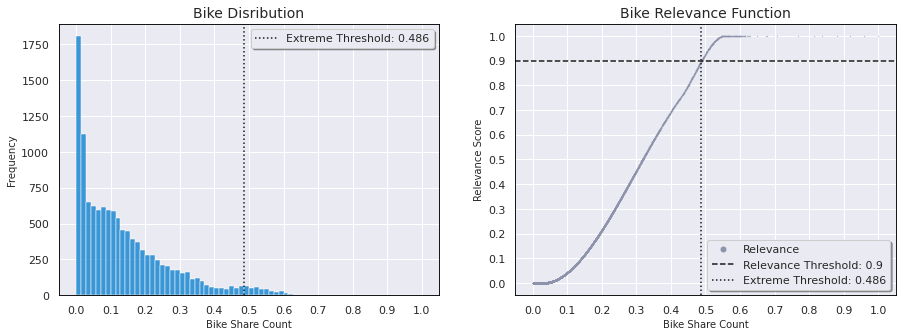

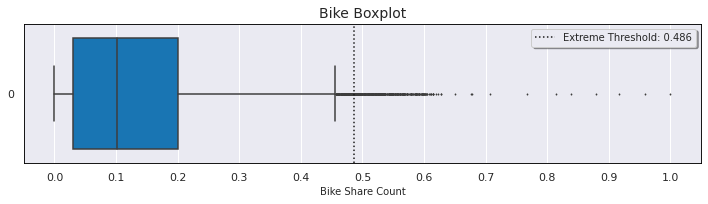

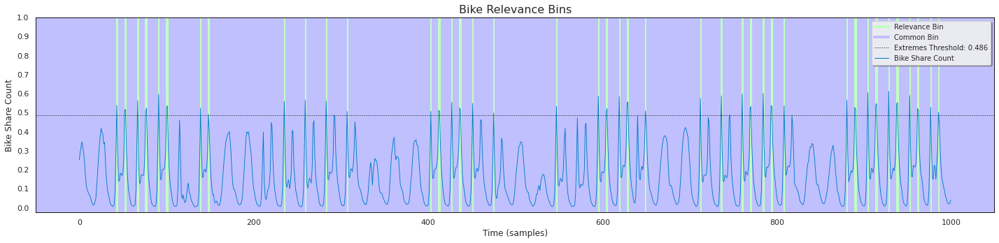

In [7]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)

#pu.PlotScaledData(data, TVAR)

r_Y_plot = RELEVANCE_FUNCTION.__call__(all_train_targets, combine=COMBINE) #relevance for plotting
k_Y_plot = [val >= RELEVANCE_THRESHOLD for val in r_Y_plot]
r_Y_plot = np.array(r_Y_plot)
k_Y_plot = np.array(k_Y_plot)

pu.PlotRelevance(all_train_targets, r_Y_plot, RELEVANCE_THRESHOLD, EXTREMES_THRESHOLD, TVAR, DATA_NAME)

#pu.PlotCaseWeightSurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)
#pu.PlotUtilitySurface(all_train_targets, RELEVANCE_FUNCTION, EXTREMES_THRESHOLD, 0.5, TVAR)

#pu.PlotBins(all_train_targets,k_Y_plot,EXTREMES_THRESHOLD, TVAR, DATA_NAME)
pu.PlotBins(all_train_targets[3000:4000],k_Y_plot[3000:4000],EXTREMES_THRESHOLD, TVAR, DATA_NAME)

# **Resampling**

In [8]:
RES_STRATS = ["SMOTER_regular", "SMOTER_bin", "SMOTER_bin_t", "SMOTER_bin_r", "SMOTER_bin_tr", "GAN_CNN", "GAN_FNN"]

**Define GAN Models**

In [9]:
import GAN as gmod
importlib.reload(gmod)

n_gan_epochs = 120
gan_batch_size = 128

CNN_GENS=None; CNN_DISCS=None; FNN_GENS=None; FNN_DISC=None

if "GAN_CNN" in RES_STRATS:
    CNN_GENS, CNN_DISCS = gmod.getGAN(k_Xex,GAN_CNN_DIR, "CNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)
if "GAN_FNN" in RES_STRATS:
    FNN_GENS, FNN_DISCS = gmod.getGAN(k_Xex,GAN_FNN_DIR, "FNN", SAMPLE_DIM, n_gan_epochs, gan_batch_size, RECORDER.log_print)

RECORDER.save_param_dict({"GAN":{"nEpochs":n_gan_epochs,"batchSize": gan_batch_size}})
print("$$$$ Finished training GANs $$$$")

LOG: 21:57:51:553 Training CNN GAN with 120 epochs



  0%|          | 0/3 [00:00<?, ?it/s]

Step 1: Generator loss: 1.410076916217804, discriminator loss: 1.3920620679855347
Step 2: Generator loss: 0.708467960357666, discriminator loss: 0.693493127822876


  0%|          | 0/3 [00:00<?, ?it/s]

Step 3: Generator loss: 0.7117032408714294, discriminator loss: 0.6912984848022461
Step 4: Generator loss: 0.7152764797210693, discriminator loss: 0.6889753341674805
Step 5: Generator loss: 0.7182998657226562, discriminator loss: 0.6865440607070923


  0%|          | 0/3 [00:00<?, ?it/s]

Step 6: Generator loss: 0.7223949432373047, discriminator loss: 0.6838693618774414
Step 7: Generator loss: 0.7247703075408936, discriminator loss: 0.6807690262794495
Step 8: Generator loss: 0.7259095907211304, discriminator loss: 0.6800312995910645


  0%|          | 0/3 [00:00<?, ?it/s]

Step 9: Generator loss: 0.7272899150848389, discriminator loss: 0.6775264739990234
Step 10: Generator loss: 0.7262772917747498, discriminator loss: 0.6768137812614441
Step 11: Generator loss: 0.7221632599830627, discriminator loss: 0.6753836274147034


  0%|          | 0/3 [00:00<?, ?it/s]

Step 12: Generator loss: 0.7192142009735107, discriminator loss: 0.6753947734832764
Step 13: Generator loss: 0.7140321135520935, discriminator loss: 0.6773313283920288
Step 14: Generator loss: 0.7083829641342163, discriminator loss: 0.6782640218734741


  0%|          | 0/3 [00:00<?, ?it/s]

Step 15: Generator loss: 0.7017931342124939, discriminator loss: 0.680542528629303
Step 16: Generator loss: 0.6940336227416992, discriminator loss: 0.6824168562889099
Step 17: Generator loss: 0.6860741972923279, discriminator loss: 0.6844481229782104


  0%|          | 0/3 [00:00<?, ?it/s]

Step 18: Generator loss: 0.6792698502540588, discriminator loss: 0.6876668930053711
Step 19: Generator loss: 0.6719271540641785, discriminator loss: 0.6887118816375732
Step 20: Generator loss: 0.6667332053184509, discriminator loss: 0.6921892166137695


  0%|          | 0/3 [00:00<?, ?it/s]

Step 21: Generator loss: 0.6613641977310181, discriminator loss: 0.694202721118927
Step 22: Generator loss: 0.657690167427063, discriminator loss: 0.6959072351455688
Step 23: Generator loss: 0.6558384895324707, discriminator loss: 0.6951814889907837


  0%|          | 0/3 [00:00<?, ?it/s]

Step 24: Generator loss: 0.6547673344612122, discriminator loss: 0.6952831745147705
Step 25: Generator loss: 0.6540209054946899, discriminator loss: 0.6972483396530151
Step 26: Generator loss: 0.6551157236099243, discriminator loss: 0.6976850032806396


  0%|          | 0/3 [00:00<?, ?it/s]

Step 27: Generator loss: 0.6552598476409912, discriminator loss: 0.6961786150932312
Step 28: Generator loss: 0.6557400822639465, discriminator loss: 0.6979246139526367
Step 29: Generator loss: 0.6572094559669495, discriminator loss: 0.6969439387321472


  0%|          | 0/3 [00:00<?, ?it/s]

Step 30: Generator loss: 0.6571401953697205, discriminator loss: 0.6981046199798584
Step 31: Generator loss: 0.656967282295227, discriminator loss: 0.6987701654434204
Step 32: Generator loss: 0.6567487120628357, discriminator loss: 0.6986062526702881


  0%|          | 0/3 [00:00<?, ?it/s]

Step 33: Generator loss: 0.6560972332954407, discriminator loss: 0.7010535597801208
Step 34: Generator loss: 0.6554027795791626, discriminator loss: 0.7021605372428894
Step 35: Generator loss: 0.6573272943496704, discriminator loss: 0.7024359703063965


  0%|          | 0/3 [00:00<?, ?it/s]

Step 36: Generator loss: 0.6597871780395508, discriminator loss: 0.7027967572212219
Step 37: Generator loss: 0.6647431254386902, discriminator loss: 0.7011261582374573
Step 38: Generator loss: 0.670691192150116, discriminator loss: 0.6996723413467407


  0%|          | 0/3 [00:00<?, ?it/s]

Step 39: Generator loss: 0.6773801445960999, discriminator loss: 0.697985053062439
Step 40: Generator loss: 0.6849203109741211, discriminator loss: 0.6950197815895081
Step 41: Generator loss: 0.6926788687705994, discriminator loss: 0.6931495070457458


  0%|          | 0/3 [00:00<?, ?it/s]

Step 42: Generator loss: 0.6997578144073486, discriminator loss: 0.6898082494735718
Step 43: Generator loss: 0.7064463496208191, discriminator loss: 0.6893227696418762
Step 44: Generator loss: 0.7107412219047546, discriminator loss: 0.6878622174263


  0%|          | 0/3 [00:00<?, ?it/s]

Step 45: Generator loss: 0.7132689952850342, discriminator loss: 0.6870908737182617
Step 46: Generator loss: 0.7129769921302795, discriminator loss: 0.6894320249557495
Step 47: Generator loss: 0.7122462391853333, discriminator loss: 0.6901119351387024


  0%|          | 0/3 [00:00<?, ?it/s]

Step 48: Generator loss: 0.709087073802948, discriminator loss: 0.6930018663406372
Step 49: Generator loss: 0.7046230435371399, discriminator loss: 0.6948460340499878
Step 50: Generator loss: 0.7069171667098999, discriminator loss: 0.695342481136322


  0%|          | 0/3 [00:00<?, ?it/s]

Step 51: Generator loss: 0.7098107933998108, discriminator loss: 0.6963375806808472
Step 52: Generator loss: 0.7142027020454407, discriminator loss: 0.6948503255844116
Step 53: Generator loss: 0.7206947207450867, discriminator loss: 0.6931379437446594


  0%|          | 0/3 [00:00<?, ?it/s]

Step 54: Generator loss: 0.7300064563751221, discriminator loss: 0.6897640228271484
Step 55: Generator loss: 0.7399872541427612, discriminator loss: 0.686163604259491
Step 56: Generator loss: 0.7516008615493774, discriminator loss: 0.6826852560043335


  0%|          | 0/3 [00:00<?, ?it/s]

Step 57: Generator loss: 0.7634099125862122, discriminator loss: 0.6778740882873535
Step 58: Generator loss: 0.7754628658294678, discriminator loss: 0.6737227439880371
Step 59: Generator loss: 0.7878404855728149, discriminator loss: 0.6682578921318054


  0%|          | 0/3 [00:00<?, ?it/s]

Step 60: Generator loss: 0.8002120852470398, discriminator loss: 0.6635987162590027
Step 61: Generator loss: 0.8123635053634644, discriminator loss: 0.6592545509338379
Step 62: Generator loss: 0.8242682814598083, discriminator loss: 0.6549239158630371


  0%|          | 0/3 [00:00<?, ?it/s]

Step 63: Generator loss: 0.8358882069587708, discriminator loss: 0.649605929851532
Step 64: Generator loss: 0.8470649719238281, discriminator loss: 0.6455512046813965
Step 65: Generator loss: 0.8575542569160461, discriminator loss: 0.6413837671279907


  0%|          | 0/3 [00:00<?, ?it/s]

Step 66: Generator loss: 0.8681627511978149, discriminator loss: 0.6364378929138184
Step 67: Generator loss: 0.8762421011924744, discriminator loss: 0.6326448321342468
Step 68: Generator loss: 0.8847041726112366, discriminator loss: 0.6292970180511475


  0%|          | 0/3 [00:00<?, ?it/s]

Step 69: Generator loss: 0.8913081288337708, discriminator loss: 0.6251415610313416
Step 70: Generator loss: 0.8949501514434814, discriminator loss: 0.6234715580940247
Step 71: Generator loss: 0.8991150259971619, discriminator loss: 0.6205168962478638


  0%|          | 0/3 [00:00<?, ?it/s]

Step 72: Generator loss: 0.8942999243736267, discriminator loss: 0.6204487085342407
Step 73: Generator loss: 0.8886075019836426, discriminator loss: 0.6213028430938721
Step 74: Generator loss: 0.8779329061508179, discriminator loss: 0.6233434081077576


  0%|          | 0/3 [00:00<?, ?it/s]

Step 75: Generator loss: 0.8627334833145142, discriminator loss: 0.6278926134109497
Step 76: Generator loss: 0.8495315909385681, discriminator loss: 0.6314331293106079
Step 77: Generator loss: 0.8345878720283508, discriminator loss: 0.6332235336303711


  0%|          | 0/3 [00:00<?, ?it/s]

Step 78: Generator loss: 0.8277756571769714, discriminator loss: 0.6349712610244751
Step 79: Generator loss: 0.8251263499259949, discriminator loss: 0.6341469287872314
Step 80: Generator loss: 0.826765775680542, discriminator loss: 0.6327004432678223


  0%|          | 0/3 [00:00<?, ?it/s]

Step 81: Generator loss: 0.8307989835739136, discriminator loss: 0.629806399345398
Step 82: Generator loss: 0.8366650342941284, discriminator loss: 0.6244765520095825
Step 83: Generator loss: 0.844666063785553, discriminator loss: 0.6207784414291382


  0%|          | 0/3 [00:00<?, ?it/s]

Step 84: Generator loss: 0.8529437184333801, discriminator loss: 0.616143524646759
Step 85: Generator loss: 0.8618278503417969, discriminator loss: 0.611070990562439
Step 86: Generator loss: 0.8707826733589172, discriminator loss: 0.6051875352859497


  0%|          | 0/3 [00:00<?, ?it/s]

Step 87: Generator loss: 0.8800112009048462, discriminator loss: 0.6003106832504272
Step 88: Generator loss: 0.8879822492599487, discriminator loss: 0.5956524610519409
Step 89: Generator loss: 0.8954992890357971, discriminator loss: 0.5926567912101746


  0%|          | 0/3 [00:00<?, ?it/s]

Step 90: Generator loss: 0.9020017385482788, discriminator loss: 0.5871738195419312
Step 91: Generator loss: 0.9059402942657471, discriminator loss: 0.5854791402816772
Step 92: Generator loss: 0.9075360894203186, discriminator loss: 0.5807998180389404


  0%|          | 0/3 [00:00<?, ?it/s]

Step 93: Generator loss: 0.90886390209198, discriminator loss: 0.5790337324142456
Step 94: Generator loss: 0.9104525446891785, discriminator loss: 0.5769878625869751
Step 95: Generator loss: 0.9131765961647034, discriminator loss: 0.5741269588470459


  0%|          | 0/3 [00:00<?, ?it/s]

Step 96: Generator loss: 0.9171751141548157, discriminator loss: 0.5718823671340942
Step 97: Generator loss: 0.9225324392318726, discriminator loss: 0.5672124624252319
Step 98: Generator loss: 0.9279870390892029, discriminator loss: 0.5634753108024597


  0%|          | 0/3 [00:00<?, ?it/s]

Step 99: Generator loss: 0.9295975565910339, discriminator loss: 0.5612419843673706
Step 100: Generator loss: 0.9306418895721436, discriminator loss: 0.5594133138656616
Step 101: Generator loss: 0.9235197901725769, discriminator loss: 0.5600470304489136


  0%|          | 0/3 [00:00<?, ?it/s]

Step 102: Generator loss: 0.9177664518356323, discriminator loss: 0.5618655681610107
Step 103: Generator loss: 0.9078419804573059, discriminator loss: 0.5643961429595947
Step 104: Generator loss: 0.8976274132728577, discriminator loss: 0.5643833875656128


  0%|          | 0/3 [00:00<?, ?it/s]

Step 105: Generator loss: 0.8941230177879333, discriminator loss: 0.565538763999939
Step 106: Generator loss: 0.8898815512657166, discriminator loss: 0.565105676651001
Step 107: Generator loss: 0.8837383389472961, discriminator loss: 0.5671043992042542


  0%|          | 0/3 [00:00<?, ?it/s]

Step 108: Generator loss: 0.879563570022583, discriminator loss: 0.5673425197601318
Step 109: Generator loss: 0.8673399090766907, discriminator loss: 0.5719053745269775
Step 110: Generator loss: 0.8537315130233765, discriminator loss: 0.5777424573898315


  0%|          | 0/3 [00:00<?, ?it/s]

Step 111: Generator loss: 0.8387067317962646, discriminator loss: 0.5827162265777588
Step 112: Generator loss: 0.8296198844909668, discriminator loss: 0.5833367109298706
Step 113: Generator loss: 0.8309690356254578, discriminator loss: 0.5837337970733643


  0%|          | 0/3 [00:00<?, ?it/s]

Step 114: Generator loss: 0.8433430194854736, discriminator loss: 0.5807933807373047
Step 115: Generator loss: 0.860314667224884, discriminator loss: 0.5741167664527893
Step 116: Generator loss: 0.8827885389328003, discriminator loss: 0.5651277303695679


  0%|          | 0/3 [00:00<?, ?it/s]

Step 117: Generator loss: 0.904729962348938, discriminator loss: 0.560021162033081
Step 118: Generator loss: 0.9286879301071167, discriminator loss: 0.5484305620193481
Step 119: Generator loss: 0.9508887529373169, discriminator loss: 0.5435129404067993


  0%|          | 0/3 [00:00<?, ?it/s]

Step 120: Generator loss: 0.9668331146240234, discriminator loss: 0.5370107889175415
Step 121: Generator loss: 0.9835307002067566, discriminator loss: 0.5324579477310181
Step 122: Generator loss: 0.9964310526847839, discriminator loss: 0.5277681350708008


  0%|          | 0/3 [00:00<?, ?it/s]

Step 123: Generator loss: 1.0144147872924805, discriminator loss: 0.5218908786773682
Step 124: Generator loss: 1.033560872077942, discriminator loss: 0.515295147895813
Step 125: Generator loss: 1.053766131401062, discriminator loss: 0.5112712979316711


  0%|          | 0/3 [00:00<?, ?it/s]

Step 126: Generator loss: 1.0743390321731567, discriminator loss: 0.504370927810669
Step 127: Generator loss: 1.089146375656128, discriminator loss: 0.4977734386920929
Step 128: Generator loss: 1.0947774648666382, discriminator loss: 0.4962869882583618


  0%|          | 0/3 [00:00<?, ?it/s]

Step 129: Generator loss: 1.0944135189056396, discriminator loss: 0.4937688708305359
Step 130: Generator loss: 1.068488359451294, discriminator loss: 0.49653366208076477
Step 131: Generator loss: 1.033657193183899, discriminator loss: 0.5122338533401489


  0%|          | 0/3 [00:00<?, ?it/s]

Step 132: Generator loss: 0.98479163646698, discriminator loss: 0.5235087275505066
Step 133: Generator loss: 0.9479612112045288, discriminator loss: 0.5278383493423462
Step 134: Generator loss: 0.9296144247055054, discriminator loss: 0.5406638383865356


  0%|          | 0/3 [00:00<?, ?it/s]

Step 135: Generator loss: 0.9269154071807861, discriminator loss: 0.5359162092208862
Step 136: Generator loss: 0.9379071593284607, discriminator loss: 0.534723162651062
Step 137: Generator loss: 0.9586935639381409, discriminator loss: 0.5265947580337524


  0%|          | 0/3 [00:00<?, ?it/s]

Step 138: Generator loss: 0.9845156669616699, discriminator loss: 0.5131291151046753
Step 139: Generator loss: 1.0135011672973633, discriminator loss: 0.5082132816314697
Step 140: Generator loss: 1.0445964336395264, discriminator loss: 0.5031560063362122


  0%|          | 0/3 [00:00<?, ?it/s]

Step 141: Generator loss: 1.0769200325012207, discriminator loss: 0.4905105531215668
Step 142: Generator loss: 1.1095986366271973, discriminator loss: 0.47708386182785034
Step 143: Generator loss: 1.142156720161438, discriminator loss: 0.46819430589675903


  0%|          | 0/3 [00:00<?, ?it/s]

Step 144: Generator loss: 1.1746898889541626, discriminator loss: 0.4626002907752991
Step 145: Generator loss: 1.2066500186920166, discriminator loss: 0.4540104269981384
Step 146: Generator loss: 1.2382124662399292, discriminator loss: 0.4362531006336212


  0%|          | 0/3 [00:00<?, ?it/s]

Step 147: Generator loss: 1.268865942955017, discriminator loss: 0.43928253650665283
Step 148: Generator loss: 1.2986035346984863, discriminator loss: 0.42540860176086426
Step 149: Generator loss: 1.3274989128112793, discriminator loss: 0.41346636414527893


  0%|          | 0/3 [00:00<?, ?it/s]

Step 150: Generator loss: 1.3553884029388428, discriminator loss: 0.40777575969696045
Step 151: Generator loss: 1.3822224140167236, discriminator loss: 0.4026964008808136
Step 152: Generator loss: 1.4079478979110718, discriminator loss: 0.40100252628326416


  0%|          | 0/3 [00:00<?, ?it/s]

Step 153: Generator loss: 1.432026982307434, discriminator loss: 0.3952995240688324
Step 154: Generator loss: 1.455079436302185, discriminator loss: 0.37966248393058777
Step 155: Generator loss: 1.4771455526351929, discriminator loss: 0.37242114543914795


  0%|          | 0/3 [00:00<?, ?it/s]

Step 156: Generator loss: 1.4980535507202148, discriminator loss: 0.3707028031349182
Step 157: Generator loss: 1.5179791450500488, discriminator loss: 0.36092835664749146
Step 158: Generator loss: 1.5367679595947266, discriminator loss: 0.3584686815738678


  0%|          | 0/3 [00:00<?, ?it/s]

Step 159: Generator loss: 1.5544657707214355, discriminator loss: 0.3501441478729248
Step 160: Generator loss: 1.571510672569275, discriminator loss: 0.342650443315506
Step 161: Generator loss: 1.5874472856521606, discriminator loss: 0.34388992190361023


  0%|          | 0/3 [00:00<?, ?it/s]

Step 162: Generator loss: 1.6028252840042114, discriminator loss: 0.3350619375705719
Step 163: Generator loss: 1.6173468828201294, discriminator loss: 0.32783615589141846
Step 164: Generator loss: 1.6314162015914917, discriminator loss: 0.32296082377433777


  0%|          | 0/3 [00:00<?, ?it/s]

Step 165: Generator loss: 1.6449084281921387, discriminator loss: 0.3197340965270996
Step 166: Generator loss: 1.6580915451049805, discriminator loss: 0.31185612082481384
Step 167: Generator loss: 1.6705491542816162, discriminator loss: 0.3073476254940033


  0%|          | 0/3 [00:00<?, ?it/s]

Step 168: Generator loss: 1.6830456256866455, discriminator loss: 0.2991676926612854
Step 169: Generator loss: 1.694939136505127, discriminator loss: 0.2982886731624603
Step 170: Generator loss: 1.7063318490982056, discriminator loss: 0.29851752519607544


  0%|          | 0/3 [00:00<?, ?it/s]

Step 171: Generator loss: 1.717663049697876, discriminator loss: 0.28552258014678955
Step 172: Generator loss: 1.7290847301483154, discriminator loss: 0.2826458215713501
Step 173: Generator loss: 1.7394170761108398, discriminator loss: 0.2874240279197693


  0%|          | 0/3 [00:00<?, ?it/s]

Step 174: Generator loss: 1.7495324611663818, discriminator loss: 0.2753443419933319
Step 175: Generator loss: 1.7587881088256836, discriminator loss: 0.27444392442703247
Step 176: Generator loss: 1.7680758237838745, discriminator loss: 0.2675440311431885


  0%|          | 0/3 [00:00<?, ?it/s]

Step 177: Generator loss: 1.7761882543563843, discriminator loss: 0.2639283835887909
Step 178: Generator loss: 1.7830065488815308, discriminator loss: 0.264602929353714
Step 179: Generator loss: 1.7850735187530518, discriminator loss: 0.2553510367870331


  0%|          | 0/3 [00:00<?, ?it/s]

Step 180: Generator loss: 1.7841439247131348, discriminator loss: 0.25623953342437744
Step 181: Generator loss: 1.7719426155090332, discriminator loss: 0.25772902369499207
Step 182: Generator loss: 1.7443751096725464, discriminator loss: 0.2519511580467224


  0%|          | 0/3 [00:00<?, ?it/s]

Step 183: Generator loss: 1.6826729774475098, discriminator loss: 0.2570931315422058
Step 184: Generator loss: 1.611969232559204, discriminator loss: 0.2650770843029022
Step 185: Generator loss: 1.4966650009155273, discriminator loss: 0.28495490550994873


  0%|          | 0/3 [00:00<?, ?it/s]

Step 186: Generator loss: 1.386916160583496, discriminator loss: 0.2996123135089874
Step 187: Generator loss: 1.3171778917312622, discriminator loss: 0.30555444955825806
Step 188: Generator loss: 1.2810382843017578, discriminator loss: 0.31003695726394653


  0%|          | 0/3 [00:00<?, ?it/s]

Step 189: Generator loss: 1.2721508741378784, discriminator loss: 0.31445741653442383
Step 190: Generator loss: 1.2826478481292725, discriminator loss: 0.3125128746032715
Step 191: Generator loss: 1.302486538887024, discriminator loss: 0.30574217438697815


  0%|          | 0/3 [00:00<?, ?it/s]

Step 192: Generator loss: 1.3270668983459473, discriminator loss: 0.30630528926849365
Step 193: Generator loss: 1.355781078338623, discriminator loss: 0.3007849454879761
Step 194: Generator loss: 1.3871781826019287, discriminator loss: 0.2836386561393738


  0%|          | 0/3 [00:00<?, ?it/s]

Step 195: Generator loss: 1.4200034141540527, discriminator loss: 0.2864351272583008
Step 196: Generator loss: 1.453705906867981, discriminator loss: 0.2805216908454895
Step 197: Generator loss: 1.4879145622253418, discriminator loss: 0.27658697962760925


  0%|          | 0/3 [00:00<?, ?it/s]

Step 198: Generator loss: 1.522336721420288, discriminator loss: 0.2709466516971588
Step 199: Generator loss: 1.5567145347595215, discriminator loss: 0.2685791552066803
Step 200: Generator loss: 1.5906010866165161, discriminator loss: 0.2572711706161499


  0%|          | 0/3 [00:00<?, ?it/s]

Step 201: Generator loss: 1.62388014793396, discriminator loss: 0.2571839392185211
Step 202: Generator loss: 1.6563454866409302, discriminator loss: 0.24568255245685577
Step 203: Generator loss: 1.6876853704452515, discriminator loss: 0.2544214427471161


  0%|          | 0/3 [00:00<?, ?it/s]

Step 204: Generator loss: 1.7170032262802124, discriminator loss: 0.2427031695842743
Step 205: Generator loss: 1.743516206741333, discriminator loss: 0.2388346791267395
Step 206: Generator loss: 1.7675786018371582, discriminator loss: 0.23958544433116913


  0%|          | 0/3 [00:00<?, ?it/s]

Step 207: Generator loss: 1.7883460521697998, discriminator loss: 0.22630058228969574
Step 208: Generator loss: 1.7983152866363525, discriminator loss: 0.23490947484970093
Step 209: Generator loss: 1.7935326099395752, discriminator loss: 0.23607692122459412


  0%|          | 0/3 [00:00<?, ?it/s]

Step 210: Generator loss: 1.7688714265823364, discriminator loss: 0.22900807857513428
Step 211: Generator loss: 1.7228511571884155, discriminator loss: 0.24366150796413422
Step 212: Generator loss: 1.6552655696868896, discriminator loss: 0.23764348030090332


  0%|          | 0/3 [00:00<?, ?it/s]

Step 213: Generator loss: 1.5950955152511597, discriminator loss: 0.25045210123062134
Step 214: Generator loss: 1.5540595054626465, discriminator loss: 0.24949532747268677
Step 215: Generator loss: 1.543522834777832, discriminator loss: 0.2600785195827484


  0%|          | 0/3 [00:00<?, ?it/s]

Step 216: Generator loss: 1.5443220138549805, discriminator loss: 0.2557685375213623
Step 217: Generator loss: 1.5587081909179688, discriminator loss: 0.25040605664253235
Step 218: Generator loss: 1.5795344114303589, discriminator loss: 0.24664261937141418


  0%|          | 0/3 [00:00<?, ?it/s]

Step 219: Generator loss: 1.6016241312026978, discriminator loss: 0.2454046905040741
Step 220: Generator loss: 1.6237483024597168, discriminator loss: 0.2376384735107422
Step 221: Generator loss: 1.6432856321334839, discriminator loss: 0.24051496386528015


  0%|          | 0/3 [00:00<?, ?it/s]

Step 222: Generator loss: 1.6595556735992432, discriminator loss: 0.23588885366916656
Step 223: Generator loss: 1.6637682914733887, discriminator loss: 0.2348269820213318
Step 224: Generator loss: 1.6473106145858765, discriminator loss: 0.23351740837097168


  0%|          | 0/3 [00:00<?, ?it/s]

Step 225: Generator loss: 1.6028598546981812, discriminator loss: 0.24036595225334167
Step 226: Generator loss: 1.5249643325805664, discriminator loss: 0.25322312116622925
Step 227: Generator loss: 1.406061053276062, discriminator loss: 0.26512712240219116


  0%|          | 0/3 [00:00<?, ?it/s]

Step 228: Generator loss: 1.2881901264190674, discriminator loss: 0.2929966151714325
Step 229: Generator loss: 1.1782448291778564, discriminator loss: 0.3151521682739258
Step 230: Generator loss: 1.1157057285308838, discriminator loss: 0.3275902569293976


  0%|          | 0/3 [00:00<?, ?it/s]

Step 231: Generator loss: 1.086637258529663, discriminator loss: 0.33752572536468506
Step 232: Generator loss: 1.0968570709228516, discriminator loss: 0.337113618850708
Step 233: Generator loss: 1.1248953342437744, discriminator loss: 0.3377166986465454


  0%|          | 0/3 [00:00<?, ?it/s]

Step 234: Generator loss: 1.1622790098190308, discriminator loss: 0.32508164644241333
Step 235: Generator loss: 1.2069196701049805, discriminator loss: 0.3169093132019043
Step 236: Generator loss: 1.254066824913025, discriminator loss: 0.31158700585365295


  0%|          | 0/3 [00:00<?, ?it/s]

Step 237: Generator loss: 1.3041062355041504, discriminator loss: 0.2971605062484741
Step 238: Generator loss: 1.354587197303772, discriminator loss: 0.30074405670166016
Step 239: Generator loss: 1.4054534435272217, discriminator loss: 0.2812948524951935


  0%|          | 0/3 [00:00<?, ?it/s]

Step 240: Generator loss: 1.456119179725647, discriminator loss: 0.2810845375061035
Step 241: Generator loss: 1.5062823295593262, discriminator loss: 0.26590532064437866
Step 242: Generator loss: 1.5549644231796265, discriminator loss: 0.2702116370201111


  0%|          | 0/3 [00:00<?, ?it/s]

Step 243: Generator loss: 1.6023869514465332, discriminator loss: 0.2568517029285431
Step 244: Generator loss: 1.6479319334030151, discriminator loss: 0.2608174979686737
Step 245: Generator loss: 1.6916447877883911, discriminator loss: 0.24622318148612976


  0%|          | 0/3 [00:00<?, ?it/s]

Step 246: Generator loss: 1.7331799268722534, discriminator loss: 0.23776520788669586
Step 247: Generator loss: 1.7730329036712646, discriminator loss: 0.24234548211097717
Step 248: Generator loss: 1.8091294765472412, discriminator loss: 0.2415611743927002


  0%|          | 0/3 [00:00<?, ?it/s]

Step 249: Generator loss: 1.8433890342712402, discriminator loss: 0.2301124632358551
Step 250: Generator loss: 1.8747293949127197, discriminator loss: 0.2358945906162262
Step 251: Generator loss: 1.904025673866272, discriminator loss: 0.21491765975952148


  0%|          | 0/3 [00:00<?, ?it/s]

Step 252: Generator loss: 1.9302400350570679, discriminator loss: 0.22666765749454498
Step 253: Generator loss: 1.9548143148422241, discriminator loss: 0.2071368396282196
Step 254: Generator loss: 1.9766148328781128, discriminator loss: 0.21334382891654968


  0%|          | 0/3 [00:00<?, ?it/s]

Step 255: Generator loss: 1.9961334466934204, discriminator loss: 0.2099277675151825
Step 256: Generator loss: 2.0131916999816895, discriminator loss: 0.2041352391242981
Step 257: Generator loss: 2.0267891883850098, discriminator loss: 0.2006811797618866


  0%|          | 0/3 [00:00<?, ?it/s]

Step 258: Generator loss: 2.036996364593506, discriminator loss: 0.2031581699848175
Step 259: Generator loss: 2.042255401611328, discriminator loss: 0.18659859895706177
Step 260: Generator loss: 2.039142370223999, discriminator loss: 0.19928407669067383


  0%|          | 0/3 [00:00<?, ?it/s]

Step 261: Generator loss: 2.024404764175415, discriminator loss: 0.18873727321624756
Step 262: Generator loss: 1.9673831462860107, discriminator loss: 0.19661195576190948
Step 263: Generator loss: 1.8886793851852417, discriminator loss: 0.20152992010116577


  0%|          | 0/3 [00:00<?, ?it/s]

Step 264: Generator loss: 1.7400225400924683, discriminator loss: 0.21060827374458313
Step 265: Generator loss: 1.6065747737884521, discriminator loss: 0.2261001169681549
Step 266: Generator loss: 1.4785277843475342, discriminator loss: 0.2454911470413208


  0%|          | 0/3 [00:00<?, ?it/s]

Step 267: Generator loss: 1.4135019779205322, discriminator loss: 0.25496646761894226
Step 268: Generator loss: 1.394930124282837, discriminator loss: 0.262910932302475
Step 269: Generator loss: 1.3998512029647827, discriminator loss: 0.24257667362689972


  0%|          | 0/3 [00:00<?, ?it/s]

Step 270: Generator loss: 1.4221813678741455, discriminator loss: 0.25261372327804565
Step 271: Generator loss: 1.4511581659317017, discriminator loss: 0.24182069301605225
Step 272: Generator loss: 1.4827524423599243, discriminator loss: 0.24757695198059082


  0%|          | 0/3 [00:00<?, ?it/s]

Step 273: Generator loss: 1.5078346729278564, discriminator loss: 0.23953001201152802
Step 274: Generator loss: 1.5278136730194092, discriminator loss: 0.24151936173439026
Step 275: Generator loss: 1.5178024768829346, discriminator loss: 0.23464670777320862


  0%|          | 0/3 [00:00<?, ?it/s]

Step 276: Generator loss: 1.4738999605178833, discriminator loss: 0.2456735372543335
Step 277: Generator loss: 1.385489821434021, discriminator loss: 0.2728331387042999
Step 278: Generator loss: 1.2361596822738647, discriminator loss: 0.2918829023838043


  0%|          | 0/3 [00:00<?, ?it/s]

Step 279: Generator loss: 1.1061192750930786, discriminator loss: 0.3311672806739807
Step 280: Generator loss: 1.0144438743591309, discriminator loss: 0.3526118993759155
Step 281: Generator loss: 0.991702139377594, discriminator loss: 0.3636346459388733


  0%|          | 0/3 [00:00<?, ?it/s]

Step 282: Generator loss: 1.013814926147461, discriminator loss: 0.3589007258415222
Step 283: Generator loss: 1.0533751249313354, discriminator loss: 0.3601817488670349
Step 284: Generator loss: 1.1044374704360962, discriminator loss: 0.33726224303245544


  0%|          | 0/3 [00:00<?, ?it/s]

Step 285: Generator loss: 1.1611032485961914, discriminator loss: 0.33871161937713623
Step 286: Generator loss: 1.2207980155944824, discriminator loss: 0.32509100437164307
Step 287: Generator loss: 1.282265067100525, discriminator loss: 0.3000560998916626


  0%|          | 0/3 [00:00<?, ?it/s]

Step 288: Generator loss: 1.3443008661270142, discriminator loss: 0.30092334747314453
Step 289: Generator loss: 1.4052876234054565, discriminator loss: 0.304658979177475
Step 290: Generator loss: 1.4653197526931763, discriminator loss: 0.2795405983924866


  0%|          | 0/3 [00:00<?, ?it/s]

Step 291: Generator loss: 1.523781418800354, discriminator loss: 0.2643911838531494
Step 292: Generator loss: 1.579404592514038, discriminator loss: 0.28508806228637695
Step 293: Generator loss: 1.6315289735794067, discriminator loss: 0.2800999879837036


  0%|          | 0/3 [00:00<?, ?it/s]

Step 294: Generator loss: 1.680426836013794, discriminator loss: 0.26537394523620605
Step 295: Generator loss: 1.7260421514511108, discriminator loss: 0.2568574845790863
Step 296: Generator loss: 1.7678656578063965, discriminator loss: 0.2617100179195404


  0%|          | 0/3 [00:00<?, ?it/s]

Step 297: Generator loss: 1.8059377670288086, discriminator loss: 0.2576908469200134
Step 298: Generator loss: 1.8402917385101318, discriminator loss: 0.248660147190094
Step 299: Generator loss: 1.8714650869369507, discriminator loss: 0.23837994039058685


  0%|          | 0/3 [00:00<?, ?it/s]

Step 300: Generator loss: 1.8979806900024414, discriminator loss: 0.2671961784362793
Step 301: Generator loss: 1.922097086906433, discriminator loss: 0.2141505628824234
Step 302: Generator loss: 1.9436990022659302, discriminator loss: 0.22876711189746857


  0%|          | 0/3 [00:00<?, ?it/s]

Step 303: Generator loss: 1.9624197483062744, discriminator loss: 0.22858411073684692
Step 304: Generator loss: 1.9784939289093018, discriminator loss: 0.2248144894838333
Step 305: Generator loss: 1.9921176433563232, discriminator loss: 0.22356528043746948


  0%|          | 0/3 [00:00<?, ?it/s]

Step 306: Generator loss: 2.004240036010742, discriminator loss: 0.20369206368923187
Step 307: Generator loss: 2.0137665271759033, discriminator loss: 0.21796299517154694
Step 308: Generator loss: 2.0211594104766846, discriminator loss: 0.22442938387393951


  0%|          | 0/3 [00:00<?, ?it/s]

Step 309: Generator loss: 2.0266599655151367, discriminator loss: 0.20876920223236084
Step 310: Generator loss: 2.030747890472412, discriminator loss: 0.19254916906356812
Step 311: Generator loss: 2.033555030822754, discriminator loss: 0.21440424025058746


  0%|          | 0/3 [00:00<?, ?it/s]

Step 312: Generator loss: 2.0358362197875977, discriminator loss: 0.19872845709323883
Step 313: Generator loss: 2.036141872406006, discriminator loss: 0.20207393169403076
Step 314: Generator loss: 2.034891128540039, discriminator loss: 0.18440254032611847


  0%|          | 0/3 [00:00<?, ?it/s]

Step 315: Generator loss: 2.0342507362365723, discriminator loss: 0.18064910173416138
Step 316: Generator loss: 2.0296008586883545, discriminator loss: 0.19074057042598724
Step 317: Generator loss: 2.0198802947998047, discriminator loss: 0.19356197118759155


  0%|          | 0/3 [00:00<?, ?it/s]

Step 318: Generator loss: 2.0097827911376953, discriminator loss: 0.18474888801574707
Step 319: Generator loss: 1.9728660583496094, discriminator loss: 0.17998775839805603
Step 320: Generator loss: 1.9206769466400146, discriminator loss: 0.19415168464183807


  0%|          | 0/3 [00:00<?, ?it/s]

Step 321: Generator loss: 1.7933294773101807, discriminator loss: 0.20007163286209106
Step 322: Generator loss: 1.5781022310256958, discriminator loss: 0.2186146229505539
Step 323: Generator loss: 1.2628512382507324, discriminator loss: 0.2725411057472229


  0%|          | 0/3 [00:00<?, ?it/s]

Step 324: Generator loss: 0.8903586268424988, discriminator loss: 0.36698830127716064
Step 325: Generator loss: 0.6019233465194702, discriminator loss: 0.512286901473999
Step 326: Generator loss: 0.3898123502731323, discriminator loss: 0.6973094344139099


  0%|          | 0/3 [00:00<?, ?it/s]

Step 327: Generator loss: 0.29469624161720276, discriminator loss: 0.8221743106842041
Step 328: Generator loss: 0.25050100684165955, discriminator loss: 0.9017475843429565
Step 329: Generator loss: 0.2489171028137207, discriminator loss: 0.9167395830154419


  0%|          | 0/3 [00:00<?, ?it/s]

Step 330: Generator loss: 0.26311105489730835, discriminator loss: 0.9000917077064514
Step 331: Generator loss: 0.2870216369628906, discriminator loss: 0.8743339776992798
Step 332: Generator loss: 0.31778624653816223, discriminator loss: 0.8251093626022339


  0%|          | 0/3 [00:00<?, ?it/s]

Step 333: Generator loss: 0.35396480560302734, discriminator loss: 0.8132123351097107
Step 334: Generator loss: 0.3951385021209717, discriminator loss: 0.7416466474533081
Step 335: Generator loss: 0.4408263564109802, discriminator loss: 0.7300105094909668


  0%|          | 0/3 [00:00<?, ?it/s]

Step 336: Generator loss: 0.4905342161655426, discriminator loss: 0.7000199556350708
Step 337: Generator loss: 0.5440148711204529, discriminator loss: 0.6646908521652222
Step 338: Generator loss: 0.600624144077301, discriminator loss: 0.6202948093414307


  0%|          | 0/3 [00:00<?, ?it/s]

Step 339: Generator loss: 0.659630537033081, discriminator loss: 0.6212171316146851
Step 340: Generator loss: 0.7202142477035522, discriminator loss: 0.5849054455757141
Step 341: Generator loss: 0.7819216847419739, discriminator loss: 0.553983211517334


  0%|          | 0/3 [00:00<?, ?it/s]

Step 342: Generator loss: 0.843344509601593, discriminator loss: 0.5665485262870789
Step 343: Generator loss: 0.9040176868438721, discriminator loss: 0.5332833528518677
Step 344: Generator loss: 0.9633346796035767, discriminator loss: 0.5110301971435547


  0%|          | 0/3 [00:00<?, ?it/s]

Step 345: Generator loss: 1.020409107208252, discriminator loss: 0.5078845024108887
Step 346: Generator loss: 1.074661374092102, discriminator loss: 0.5006117820739746
Step 347: Generator loss: 1.125406265258789, discriminator loss: 0.5116022229194641


  0%|          | 0/3 [00:00<?, ?it/s]

Step 348: Generator loss: 1.1723378896713257, discriminator loss: 0.48859459161758423
Step 349: Generator loss: 1.2157634496688843, discriminator loss: 0.45775026082992554
Step 350: Generator loss: 1.2546420097351074, discriminator loss: 0.5082845687866211


  0%|          | 0/3 [00:00<?, ?it/s]

Step 351: Generator loss: 1.2890506982803345, discriminator loss: 0.49476557970046997
Step 352: Generator loss: 1.3196959495544434, discriminator loss: 0.4442317485809326
Step 353: Generator loss: 1.3464909791946411, discriminator loss: 0.45028626918792725


  0%|          | 0/3 [00:00<?, ?it/s]

Step 354: Generator loss: 1.369086503982544, discriminator loss: 0.4792243540287018
Step 355: Generator loss: 1.388527750968933, discriminator loss: 0.4214323163032532
Step 356: Generator loss: 1.4048126935958862, discriminator loss: 0.4282069802284241


  0%|          | 0/3 [00:00<?, ?it/s]

Step 357: Generator loss: 1.4178950786590576, discriminator loss: 0.44575035572052
Step 358: Generator loss: 1.4283593893051147, discriminator loss: 0.42887288331985474
Step 359: Generator loss: 1.4367308616638184, discriminator loss: 0.38885197043418884
LOG: 22:06:45:322 Training FNN GAN with 120 epochs



  0%|          | 0/3 [00:00<?, ?it/s]

Step 1: Generator loss: 1.3818219304084778, discriminator loss: 1.383672058582306
Step 2: Generator loss: 0.692154049873352, discriminator loss: 0.6912413835525513


  0%|          | 0/3 [00:00<?, ?it/s]

Step 3: Generator loss: 0.6929869651794434, discriminator loss: 0.690945029258728
Step 4: Generator loss: 0.6938343048095703, discriminator loss: 0.6904740333557129
Step 5: Generator loss: 0.6946315169334412, discriminator loss: 0.69014573097229


  0%|          | 0/3 [00:00<?, ?it/s]

Step 6: Generator loss: 0.6954918503761292, discriminator loss: 0.6898105144500732
Step 7: Generator loss: 0.696305513381958, discriminator loss: 0.6893022656440735
Step 8: Generator loss: 0.6971436142921448, discriminator loss: 0.6890897750854492


  0%|          | 0/3 [00:00<?, ?it/s]

Step 9: Generator loss: 0.6978771686553955, discriminator loss: 0.6887378692626953
Step 10: Generator loss: 0.6987802982330322, discriminator loss: 0.6883032321929932
Step 11: Generator loss: 0.6994648575782776, discriminator loss: 0.6877833604812622


  0%|          | 0/3 [00:00<?, ?it/s]

Step 12: Generator loss: 0.7003707885742188, discriminator loss: 0.6874263286590576
Step 13: Generator loss: 0.7011893391609192, discriminator loss: 0.6871880292892456
Step 14: Generator loss: 0.7020267844200134, discriminator loss: 0.6870245933532715


  0%|          | 0/3 [00:00<?, ?it/s]

Step 15: Generator loss: 0.7027907371520996, discriminator loss: 0.6863387823104858
Step 16: Generator loss: 0.7036246657371521, discriminator loss: 0.6862037181854248
Step 17: Generator loss: 0.7044733762741089, discriminator loss: 0.6857212781906128


  0%|          | 0/3 [00:00<?, ?it/s]

Step 18: Generator loss: 0.7053297758102417, discriminator loss: 0.6852608919143677
Step 19: Generator loss: 0.7060775756835938, discriminator loss: 0.6851896047592163
Step 20: Generator loss: 0.7068902254104614, discriminator loss: 0.6845946311950684


  0%|          | 0/3 [00:00<?, ?it/s]

Step 21: Generator loss: 0.7076486349105835, discriminator loss: 0.6844332814216614
Step 22: Generator loss: 0.7084185481071472, discriminator loss: 0.6837432384490967
Step 23: Generator loss: 0.7093058824539185, discriminator loss: 0.6835960745811462


  0%|          | 0/3 [00:00<?, ?it/s]

Step 24: Generator loss: 0.7100130319595337, discriminator loss: 0.6835893392562866
Step 25: Generator loss: 0.7108253240585327, discriminator loss: 0.6827964782714844
Step 26: Generator loss: 0.7116028070449829, discriminator loss: 0.6820445656776428


  0%|          | 0/3 [00:00<?, ?it/s]

Step 27: Generator loss: 0.7125123143196106, discriminator loss: 0.6820439696311951
Step 28: Generator loss: 0.7132259607315063, discriminator loss: 0.6817752122879028
Step 29: Generator loss: 0.7139710187911987, discriminator loss: 0.6814623475074768


  0%|          | 0/3 [00:00<?, ?it/s]

Step 30: Generator loss: 0.7146745324134827, discriminator loss: 0.6810309886932373
Step 31: Generator loss: 0.7155927419662476, discriminator loss: 0.6804060935974121
Step 32: Generator loss: 0.7162379026412964, discriminator loss: 0.6807221174240112


  0%|          | 0/3 [00:00<?, ?it/s]

Step 33: Generator loss: 0.7170693874359131, discriminator loss: 0.6798364520072937
Step 34: Generator loss: 0.7178006172180176, discriminator loss: 0.6793494820594788
Step 35: Generator loss: 0.7185268402099609, discriminator loss: 0.679881751537323


  0%|          | 0/3 [00:00<?, ?it/s]

Step 36: Generator loss: 0.7193381786346436, discriminator loss: 0.678919792175293
Step 37: Generator loss: 0.7199481725692749, discriminator loss: 0.6787400841712952
Step 38: Generator loss: 0.7206950187683105, discriminator loss: 0.6782983541488647


  0%|          | 0/3 [00:00<?, ?it/s]

Step 39: Generator loss: 0.7215920686721802, discriminator loss: 0.6778508424758911
Step 40: Generator loss: 0.7222620248794556, discriminator loss: 0.677247941493988
Step 41: Generator loss: 0.7229207754135132, discriminator loss: 0.6778762340545654


  0%|          | 0/3 [00:00<?, ?it/s]

Step 42: Generator loss: 0.7237130403518677, discriminator loss: 0.6768954992294312
Step 43: Generator loss: 0.7244158387184143, discriminator loss: 0.6770138144493103
Step 44: Generator loss: 0.7251535058021545, discriminator loss: 0.6759817004203796


  0%|          | 0/3 [00:00<?, ?it/s]

Step 45: Generator loss: 0.7259154319763184, discriminator loss: 0.6760473847389221
Step 46: Generator loss: 0.7265993356704712, discriminator loss: 0.6752989292144775
Step 47: Generator loss: 0.727358877658844, discriminator loss: 0.6758426427841187


  0%|          | 0/3 [00:00<?, ?it/s]

Step 48: Generator loss: 0.7281174659729004, discriminator loss: 0.6747987270355225
Step 49: Generator loss: 0.7286967039108276, discriminator loss: 0.6748508214950562
Step 50: Generator loss: 0.7295411825180054, discriminator loss: 0.6744812726974487


  0%|          | 0/3 [00:00<?, ?it/s]

Step 51: Generator loss: 0.7302291989326477, discriminator loss: 0.6741098165512085
Step 52: Generator loss: 0.730866551399231, discriminator loss: 0.6741829514503479
Step 53: Generator loss: 0.7316222786903381, discriminator loss: 0.672980785369873


  0%|          | 0/3 [00:00<?, ?it/s]

Step 54: Generator loss: 0.7321454286575317, discriminator loss: 0.6725461483001709
Step 55: Generator loss: 0.7331053614616394, discriminator loss: 0.6726264357566833
Step 56: Generator loss: 0.7337228059768677, discriminator loss: 0.6735638380050659


  0%|          | 0/3 [00:00<?, ?it/s]

Step 57: Generator loss: 0.734494686126709, discriminator loss: 0.672444760799408
Step 58: Generator loss: 0.7350714206695557, discriminator loss: 0.6719765663146973
Step 59: Generator loss: 0.7360031604766846, discriminator loss: 0.6713848114013672


  0%|          | 0/3 [00:00<?, ?it/s]

Step 60: Generator loss: 0.7367969155311584, discriminator loss: 0.6711012125015259
Step 61: Generator loss: 0.7373162508010864, discriminator loss: 0.6714438199996948
Step 62: Generator loss: 0.7381687164306641, discriminator loss: 0.6703619956970215


  0%|          | 0/3 [00:00<?, ?it/s]

Step 63: Generator loss: 0.7388390302658081, discriminator loss: 0.6705912351608276
Step 64: Generator loss: 0.7396625280380249, discriminator loss: 0.669905424118042
Step 65: Generator loss: 0.740267276763916, discriminator loss: 0.6698634624481201


  0%|          | 0/3 [00:00<?, ?it/s]

Step 66: Generator loss: 0.7408996820449829, discriminator loss: 0.6695272326469421
Step 67: Generator loss: 0.741631269454956, discriminator loss: 0.6695000529289246
Step 68: Generator loss: 0.7422680854797363, discriminator loss: 0.6684603691101074


  0%|          | 0/3 [00:00<?, ?it/s]

Step 69: Generator loss: 0.7430418729782104, discriminator loss: 0.6681629419326782
Step 70: Generator loss: 0.7439157962799072, discriminator loss: 0.6686614751815796
Step 71: Generator loss: 0.74462890625, discriminator loss: 0.6679979562759399


  0%|          | 0/3 [00:00<?, ?it/s]

Step 72: Generator loss: 0.7453120350837708, discriminator loss: 0.6672021150588989
Step 73: Generator loss: 0.7460136413574219, discriminator loss: 0.667585551738739
Step 74: Generator loss: 0.74675452709198, discriminator loss: 0.6673029661178589


  0%|          | 0/3 [00:00<?, ?it/s]

Step 75: Generator loss: 0.7474614977836609, discriminator loss: 0.6663253903388977
Step 76: Generator loss: 0.7481014132499695, discriminator loss: 0.6670081615447998
Step 77: Generator loss: 0.7489225268363953, discriminator loss: 0.6660991907119751


  0%|          | 0/3 [00:00<?, ?it/s]

Step 78: Generator loss: 0.749629020690918, discriminator loss: 0.6654989719390869
Step 79: Generator loss: 0.7505016326904297, discriminator loss: 0.6654831767082214
Step 80: Generator loss: 0.7510809898376465, discriminator loss: 0.6658763885498047


  0%|          | 0/3 [00:00<?, ?it/s]

Step 81: Generator loss: 0.7518434524536133, discriminator loss: 0.6645221710205078
Step 82: Generator loss: 0.7526788711547852, discriminator loss: 0.6653934717178345
Step 83: Generator loss: 0.7533833384513855, discriminator loss: 0.6640528440475464


  0%|          | 0/3 [00:00<?, ?it/s]

Step 84: Generator loss: 0.7540367841720581, discriminator loss: 0.6643952131271362
Step 85: Generator loss: 0.7549158930778503, discriminator loss: 0.6638299226760864
Step 86: Generator loss: 0.7556939125061035, discriminator loss: 0.6631300449371338


  0%|          | 0/3 [00:00<?, ?it/s]

Step 87: Generator loss: 0.7561368346214294, discriminator loss: 0.6634021997451782
Step 88: Generator loss: 0.7570112943649292, discriminator loss: 0.6624462604522705
Step 89: Generator loss: 0.7578986883163452, discriminator loss: 0.6629661321640015


  0%|          | 0/3 [00:00<?, ?it/s]

Step 90: Generator loss: 0.7585387229919434, discriminator loss: 0.662896454334259
Step 91: Generator loss: 0.759134829044342, discriminator loss: 0.6618149280548096
Step 92: Generator loss: 0.7597355842590332, discriminator loss: 0.6616207361221313


  0%|          | 0/3 [00:00<?, ?it/s]

Step 93: Generator loss: 0.760737419128418, discriminator loss: 0.6614609956741333
Step 94: Generator loss: 0.7613524794578552, discriminator loss: 0.662388801574707
Step 95: Generator loss: 0.762055516242981, discriminator loss: 0.6597055792808533


  0%|          | 0/3 [00:00<?, ?it/s]

Step 96: Generator loss: 0.7628272771835327, discriminator loss: 0.6618342399597168
Step 97: Generator loss: 0.763447642326355, discriminator loss: 0.6601263284683228
Step 98: Generator loss: 0.7642403244972229, discriminator loss: 0.6592117547988892


  0%|          | 0/3 [00:00<?, ?it/s]

Step 99: Generator loss: 0.7646809816360474, discriminator loss: 0.6586945056915283
Step 100: Generator loss: 0.7657186388969421, discriminator loss: 0.659756064414978
Step 101: Generator loss: 0.7664421796798706, discriminator loss: 0.660430908203125


  0%|          | 0/3 [00:00<?, ?it/s]

Step 102: Generator loss: 0.767133891582489, discriminator loss: 0.6593421697616577
Step 103: Generator loss: 0.7679803371429443, discriminator loss: 0.658832311630249
Step 104: Generator loss: 0.768739640712738, discriminator loss: 0.6578836441040039


  0%|          | 0/3 [00:00<?, ?it/s]

Step 105: Generator loss: 0.7693604826927185, discriminator loss: 0.6590566635131836
Step 106: Generator loss: 0.7701892256736755, discriminator loss: 0.6579439640045166
Step 107: Generator loss: 0.7706177234649658, discriminator loss: 0.6565213799476624


  0%|          | 0/3 [00:00<?, ?it/s]

Step 108: Generator loss: 0.7714107632637024, discriminator loss: 0.6561837196350098
Step 109: Generator loss: 0.7722358107566833, discriminator loss: 0.6583364605903625
Step 110: Generator loss: 0.7729739546775818, discriminator loss: 0.6565995812416077


  0%|          | 0/3 [00:00<?, ?it/s]

Step 111: Generator loss: 0.7734643220901489, discriminator loss: 0.6572299003601074
Step 112: Generator loss: 0.7743457555770874, discriminator loss: 0.6568698883056641
Step 113: Generator loss: 0.7752317190170288, discriminator loss: 0.6540707945823669


  0%|          | 0/3 [00:00<?, ?it/s]

Step 114: Generator loss: 0.775871992111206, discriminator loss: 0.6558853983879089
Step 115: Generator loss: 0.7766597867012024, discriminator loss: 0.6558609008789062
Step 116: Generator loss: 0.7774204015731812, discriminator loss: 0.6542871594429016


  0%|          | 0/3 [00:00<?, ?it/s]

Step 117: Generator loss: 0.7779730558395386, discriminator loss: 0.6546591520309448
Step 118: Generator loss: 0.7785871028900146, discriminator loss: 0.653536319732666
Step 119: Generator loss: 0.7795968055725098, discriminator loss: 0.6555590629577637


  0%|          | 0/3 [00:00<?, ?it/s]

Step 120: Generator loss: 0.7800459861755371, discriminator loss: 0.6535430550575256
Step 121: Generator loss: 0.7808279991149902, discriminator loss: 0.653526782989502
Step 122: Generator loss: 0.7814966440200806, discriminator loss: 0.6543567180633545


  0%|          | 0/3 [00:00<?, ?it/s]

Step 123: Generator loss: 0.7823357582092285, discriminator loss: 0.6523081064224243
Step 124: Generator loss: 0.7832144498825073, discriminator loss: 0.6540322303771973
Step 125: Generator loss: 0.7839604616165161, discriminator loss: 0.6523340344429016


  0%|          | 0/3 [00:00<?, ?it/s]

Step 126: Generator loss: 0.7844212651252747, discriminator loss: 0.6523500680923462
Step 127: Generator loss: 0.785147488117218, discriminator loss: 0.652147650718689
Step 128: Generator loss: 0.7862622737884521, discriminator loss: 0.6517316102981567


  0%|          | 0/3 [00:00<?, ?it/s]

Step 129: Generator loss: 0.7866572141647339, discriminator loss: 0.6514542102813721
Step 130: Generator loss: 0.7875279784202576, discriminator loss: 0.651100754737854
Step 131: Generator loss: 0.7878952622413635, discriminator loss: 0.6515346765518188


  0%|          | 0/3 [00:00<?, ?it/s]

Step 132: Generator loss: 0.78892582654953, discriminator loss: 0.651775598526001
Step 133: Generator loss: 0.7891867756843567, discriminator loss: 0.6499866843223572
Step 134: Generator loss: 0.7899935245513916, discriminator loss: 0.6499265432357788


  0%|          | 0/3 [00:00<?, ?it/s]

Step 135: Generator loss: 0.7908211946487427, discriminator loss: 0.6515570878982544
Step 136: Generator loss: 0.7917652130126953, discriminator loss: 0.6477283239364624
Step 137: Generator loss: 0.7919657826423645, discriminator loss: 0.650381863117218


  0%|          | 0/3 [00:00<?, ?it/s]

Step 138: Generator loss: 0.792407214641571, discriminator loss: 0.6510221362113953
Step 139: Generator loss: 0.7932955026626587, discriminator loss: 0.6485276222229004
Step 140: Generator loss: 0.79408860206604, discriminator loss: 0.6475886106491089


  0%|          | 0/3 [00:00<?, ?it/s]

Step 141: Generator loss: 0.7945576906204224, discriminator loss: 0.6497507095336914
Step 142: Generator loss: 0.7950071096420288, discriminator loss: 0.6496248245239258
Step 143: Generator loss: 0.7960977554321289, discriminator loss: 0.6453754305839539


  0%|          | 0/3 [00:00<?, ?it/s]

Step 144: Generator loss: 0.7963595986366272, discriminator loss: 0.6464732885360718
Step 145: Generator loss: 0.7971445322036743, discriminator loss: 0.6469643115997314
Step 146: Generator loss: 0.797870397567749, discriminator loss: 0.64990234375


  0%|          | 0/3 [00:00<?, ?it/s]

Step 147: Generator loss: 0.79803466796875, discriminator loss: 0.6466856002807617
Step 148: Generator loss: 0.7991178035736084, discriminator loss: 0.6480964422225952
Step 149: Generator loss: 0.7993155121803284, discriminator loss: 0.646101713180542


  0%|          | 0/3 [00:00<?, ?it/s]

Step 150: Generator loss: 0.8002692461013794, discriminator loss: 0.6489832401275635
Step 151: Generator loss: 0.8010497093200684, discriminator loss: 0.6466280221939087
Step 152: Generator loss: 0.8013312220573425, discriminator loss: 0.6431113481521606


  0%|          | 0/3 [00:00<?, ?it/s]

Step 153: Generator loss: 0.8015365600585938, discriminator loss: 0.6450620889663696
Step 154: Generator loss: 0.8024681806564331, discriminator loss: 0.6445039510726929
Step 155: Generator loss: 0.8029829263687134, discriminator loss: 0.6481573581695557


  0%|          | 0/3 [00:00<?, ?it/s]

Step 156: Generator loss: 0.803581714630127, discriminator loss: 0.646905779838562
Step 157: Generator loss: 0.8045677542686462, discriminator loss: 0.6433203220367432
Step 158: Generator loss: 0.8047240972518921, discriminator loss: 0.6452161073684692


  0%|          | 0/3 [00:00<?, ?it/s]

Step 159: Generator loss: 0.8051454424858093, discriminator loss: 0.6448267698287964
Step 160: Generator loss: 0.8059630393981934, discriminator loss: 0.6432294249534607
Step 161: Generator loss: 0.8060864210128784, discriminator loss: 0.6455078125


  0%|          | 0/3 [00:00<?, ?it/s]

Step 162: Generator loss: 0.8068022727966309, discriminator loss: 0.6435996294021606
Step 163: Generator loss: 0.8073624968528748, discriminator loss: 0.6433165073394775
Step 164: Generator loss: 0.8077813982963562, discriminator loss: 0.6447634696960449


  0%|          | 0/3 [00:00<?, ?it/s]

Step 165: Generator loss: 0.808245062828064, discriminator loss: 0.6437881588935852
Step 166: Generator loss: 0.8088250160217285, discriminator loss: 0.6418219804763794
Step 167: Generator loss: 0.8097976446151733, discriminator loss: 0.6445043087005615


  0%|          | 0/3 [00:00<?, ?it/s]

Step 168: Generator loss: 0.8099546432495117, discriminator loss: 0.6431217193603516
Step 169: Generator loss: 0.8102108240127563, discriminator loss: 0.6441736221313477
Step 170: Generator loss: 0.8113139867782593, discriminator loss: 0.6404728889465332


  0%|          | 0/3 [00:00<?, ?it/s]

Step 171: Generator loss: 0.8112139105796814, discriminator loss: 0.6427370309829712
Step 172: Generator loss: 0.8120794892311096, discriminator loss: 0.6428739428520203
Step 173: Generator loss: 0.8120129108428955, discriminator loss: 0.6406612396240234


  0%|          | 0/3 [00:00<?, ?it/s]

Step 174: Generator loss: 0.8127269744873047, discriminator loss: 0.6406760215759277
Step 175: Generator loss: 0.8132829070091248, discriminator loss: 0.6449898481369019
Step 176: Generator loss: 0.8139721155166626, discriminator loss: 0.638993501663208


  0%|          | 0/3 [00:00<?, ?it/s]

Step 177: Generator loss: 0.8136845827102661, discriminator loss: 0.6424977779388428
Step 178: Generator loss: 0.8147785663604736, discriminator loss: 0.6426337957382202
Step 179: Generator loss: 0.8149429559707642, discriminator loss: 0.6375579833984375


  0%|          | 0/3 [00:00<?, ?it/s]

Step 180: Generator loss: 0.8158206343650818, discriminator loss: 0.6413451433181763
Step 181: Generator loss: 0.8160836696624756, discriminator loss: 0.642189085483551
Step 182: Generator loss: 0.8163933753967285, discriminator loss: 0.6377635598182678


  0%|          | 0/3 [00:00<?, ?it/s]

Step 183: Generator loss: 0.8167941570281982, discriminator loss: 0.6390893459320068
Step 184: Generator loss: 0.8170148134231567, discriminator loss: 0.6404995918273926
Step 185: Generator loss: 0.8176296949386597, discriminator loss: 0.6410278081893921


  0%|          | 0/3 [00:00<?, ?it/s]

Step 186: Generator loss: 0.8182589411735535, discriminator loss: 0.6396822929382324
Step 187: Generator loss: 0.8181972503662109, discriminator loss: 0.6412582397460938
Step 188: Generator loss: 0.8188389539718628, discriminator loss: 0.6379399299621582


  0%|          | 0/3 [00:00<?, ?it/s]

Step 189: Generator loss: 0.8192480802536011, discriminator loss: 0.637488603591919
Step 190: Generator loss: 0.8201122879981995, discriminator loss: 0.6386552453041077
Step 191: Generator loss: 0.820024311542511, discriminator loss: 0.6418944001197815


  0%|          | 0/3 [00:00<?, ?it/s]

Step 192: Generator loss: 0.8205427527427673, discriminator loss: 0.6388314962387085
Step 193: Generator loss: 0.8204929828643799, discriminator loss: 0.6378000974655151
Step 194: Generator loss: 0.8213726282119751, discriminator loss: 0.6393390893936157


  0%|          | 0/3 [00:00<?, ?it/s]

Step 195: Generator loss: 0.8220024704933167, discriminator loss: 0.6354092359542847
Step 196: Generator loss: 0.8220093250274658, discriminator loss: 0.6412591934204102
Step 197: Generator loss: 0.8217700719833374, discriminator loss: 0.6379610300064087


  0%|          | 0/3 [00:00<?, ?it/s]

Step 198: Generator loss: 0.8227601647377014, discriminator loss: 0.6400580406188965
Step 199: Generator loss: 0.8235878944396973, discriminator loss: 0.6362490653991699
Step 200: Generator loss: 0.8236320614814758, discriminator loss: 0.6370556950569153


  0%|          | 0/3 [00:00<?, ?it/s]

Step 201: Generator loss: 0.8237844109535217, discriminator loss: 0.6381219029426575
Step 202: Generator loss: 0.8240187764167786, discriminator loss: 0.6362584233283997
Step 203: Generator loss: 0.8245226740837097, discriminator loss: 0.6378623247146606


  0%|          | 0/3 [00:00<?, ?it/s]

Step 204: Generator loss: 0.8249330520629883, discriminator loss: 0.636633574962616
Step 205: Generator loss: 0.8251615166664124, discriminator loss: 0.6352643370628357
Step 206: Generator loss: 0.8252648115158081, discriminator loss: 0.6392909288406372


  0%|          | 0/3 [00:00<?, ?it/s]

Step 207: Generator loss: 0.8260816335678101, discriminator loss: 0.637056291103363
Step 208: Generator loss: 0.8264976739883423, discriminator loss: 0.6346595287322998
Step 209: Generator loss: 0.8263892531394958, discriminator loss: 0.6384419202804565


  0%|          | 0/3 [00:00<?, ?it/s]

Step 210: Generator loss: 0.8274056911468506, discriminator loss: 0.6355475187301636
Step 211: Generator loss: 0.8270663022994995, discriminator loss: 0.6385178565979004
Step 212: Generator loss: 0.826996922492981, discriminator loss: 0.6337992548942566


  0%|          | 0/3 [00:00<?, ?it/s]

Step 213: Generator loss: 0.8277701735496521, discriminator loss: 0.6320909857749939
Step 214: Generator loss: 0.8282026052474976, discriminator loss: 0.6387555599212646
Step 215: Generator loss: 0.8286489844322205, discriminator loss: 0.6364907622337341


  0%|          | 0/3 [00:00<?, ?it/s]

Step 216: Generator loss: 0.8287293314933777, discriminator loss: 0.6342306137084961
Step 217: Generator loss: 0.8287290930747986, discriminator loss: 0.6318008899688721
Step 218: Generator loss: 0.8298638463020325, discriminator loss: 0.6412058472633362


  0%|          | 0/3 [00:00<?, ?it/s]

Step 219: Generator loss: 0.8300672173500061, discriminator loss: 0.6395708322525024
Step 220: Generator loss: 0.8300997614860535, discriminator loss: 0.6319655179977417
Step 221: Generator loss: 0.8305596709251404, discriminator loss: 0.633578360080719


  0%|          | 0/3 [00:00<?, ?it/s]

Step 222: Generator loss: 0.8303948640823364, discriminator loss: 0.6400611400604248
Step 223: Generator loss: 0.8311458230018616, discriminator loss: 0.6302945613861084
Step 224: Generator loss: 0.8308285474777222, discriminator loss: 0.633578896522522


  0%|          | 0/3 [00:00<?, ?it/s]

Step 225: Generator loss: 0.8317967653274536, discriminator loss: 0.634967565536499
Step 226: Generator loss: 0.8316597938537598, discriminator loss: 0.6332583427429199
Step 227: Generator loss: 0.8321055173873901, discriminator loss: 0.6347873210906982


  0%|          | 0/3 [00:00<?, ?it/s]

Step 228: Generator loss: 0.8318370580673218, discriminator loss: 0.6344935894012451
Step 229: Generator loss: 0.831998884677887, discriminator loss: 0.6333609819412231
Step 230: Generator loss: 0.8328657150268555, discriminator loss: 0.6344789266586304


  0%|          | 0/3 [00:00<?, ?it/s]

Step 231: Generator loss: 0.8330527544021606, discriminator loss: 0.6362729668617249
Step 232: Generator loss: 0.8328143954277039, discriminator loss: 0.6318567991256714
Step 233: Generator loss: 0.833540678024292, discriminator loss: 0.633002758026123


  0%|          | 0/3 [00:00<?, ?it/s]

Step 234: Generator loss: 0.8335682153701782, discriminator loss: 0.6320849657058716
Step 235: Generator loss: 0.8341813087463379, discriminator loss: 0.6333634257316589
Step 236: Generator loss: 0.8341643214225769, discriminator loss: 0.6344089508056641


  0%|          | 0/3 [00:00<?, ?it/s]

Step 237: Generator loss: 0.8349031805992126, discriminator loss: 0.6371304392814636
Step 238: Generator loss: 0.8342883586883545, discriminator loss: 0.6322159767150879
Step 239: Generator loss: 0.8345445990562439, discriminator loss: 0.6293119192123413


  0%|          | 0/3 [00:00<?, ?it/s]

Step 240: Generator loss: 0.8346289396286011, discriminator loss: 0.6313620805740356
Step 241: Generator loss: 0.8346808552742004, discriminator loss: 0.633286714553833
Step 242: Generator loss: 0.8362042307853699, discriminator loss: 0.6339883804321289


  0%|          | 0/3 [00:00<?, ?it/s]

Step 243: Generator loss: 0.835688591003418, discriminator loss: 0.6309321522712708
Step 244: Generator loss: 0.835665762424469, discriminator loss: 0.634429395198822
Step 245: Generator loss: 0.836645781993866, discriminator loss: 0.6318458318710327


  0%|          | 0/3 [00:00<?, ?it/s]

Step 246: Generator loss: 0.8355870246887207, discriminator loss: 0.6318949460983276
Step 247: Generator loss: 0.8360572457313538, discriminator loss: 0.6318211555480957
Step 248: Generator loss: 0.836209237575531, discriminator loss: 0.632985532283783


  0%|          | 0/3 [00:00<?, ?it/s]

Step 249: Generator loss: 0.8363573551177979, discriminator loss: 0.6304371356964111
Step 250: Generator loss: 0.8374214172363281, discriminator loss: 0.6334054470062256
Step 251: Generator loss: 0.8369719982147217, discriminator loss: 0.6318094730377197


  0%|          | 0/3 [00:00<?, ?it/s]

Step 252: Generator loss: 0.8370038270950317, discriminator loss: 0.6330646276473999
Step 253: Generator loss: 0.8370295763015747, discriminator loss: 0.6298555135726929
Step 254: Generator loss: 0.8374364376068115, discriminator loss: 0.6324746012687683


  0%|          | 0/3 [00:00<?, ?it/s]

Step 255: Generator loss: 0.8373575210571289, discriminator loss: 0.634342610836029
Step 256: Generator loss: 0.8373026251792908, discriminator loss: 0.6309003233909607
Step 257: Generator loss: 0.8376190662384033, discriminator loss: 0.62848961353302


  0%|          | 0/3 [00:00<?, ?it/s]

Step 258: Generator loss: 0.8371215462684631, discriminator loss: 0.6314717531204224
Step 259: Generator loss: 0.8378472328186035, discriminator loss: 0.6344445943832397
Step 260: Generator loss: 0.837721049785614, discriminator loss: 0.626603901386261


  0%|          | 0/3 [00:00<?, ?it/s]

Step 261: Generator loss: 0.8385718464851379, discriminator loss: 0.6312997341156006
Step 262: Generator loss: 0.8383660912513733, discriminator loss: 0.6309769749641418
Step 263: Generator loss: 0.8391146659851074, discriminator loss: 0.6307425498962402


  0%|          | 0/3 [00:00<?, ?it/s]

Step 264: Generator loss: 0.8387942910194397, discriminator loss: 0.6269148588180542
Step 265: Generator loss: 0.8386715650558472, discriminator loss: 0.6299323439598083
Step 266: Generator loss: 0.8388037085533142, discriminator loss: 0.6360685229301453


  0%|          | 0/3 [00:00<?, ?it/s]

Step 267: Generator loss: 0.8397259712219238, discriminator loss: 0.6288900971412659
Step 268: Generator loss: 0.8385980129241943, discriminator loss: 0.6369190812110901
Step 269: Generator loss: 0.8391978144645691, discriminator loss: 0.6251518726348877


  0%|          | 0/3 [00:00<?, ?it/s]

Step 270: Generator loss: 0.8394975662231445, discriminator loss: 0.6292850375175476
Step 271: Generator loss: 0.8399778604507446, discriminator loss: 0.6274100542068481
Step 272: Generator loss: 0.8401438593864441, discriminator loss: 0.6355768442153931


  0%|          | 0/3 [00:00<?, ?it/s]

Step 273: Generator loss: 0.8404335975646973, discriminator loss: 0.6320692896842957
Step 274: Generator loss: 0.8407660722732544, discriminator loss: 0.6301019191741943
Step 275: Generator loss: 0.8408962488174438, discriminator loss: 0.6278014183044434


  0%|          | 0/3 [00:00<?, ?it/s]

Step 276: Generator loss: 0.839663028717041, discriminator loss: 0.6273632049560547
Step 277: Generator loss: 0.8400156497955322, discriminator loss: 0.6322202682495117
Step 278: Generator loss: 0.8384283185005188, discriminator loss: 0.6300056576728821


  0%|          | 0/3 [00:00<?, ?it/s]

Step 279: Generator loss: 0.8399488925933838, discriminator loss: 0.6264619827270508
Step 280: Generator loss: 0.8401017189025879, discriminator loss: 0.63182532787323
Step 281: Generator loss: 0.8408235907554626, discriminator loss: 0.6308854818344116


  0%|          | 0/3 [00:00<?, ?it/s]

Step 282: Generator loss: 0.840036153793335, discriminator loss: 0.6303185224533081
Step 283: Generator loss: 0.8400667905807495, discriminator loss: 0.6295393705368042
Step 284: Generator loss: 0.8408109545707703, discriminator loss: 0.6285754442214966


  0%|          | 0/3 [00:00<?, ?it/s]

Step 285: Generator loss: 0.8407900929450989, discriminator loss: 0.6294844150543213
Step 286: Generator loss: 0.8400850296020508, discriminator loss: 0.6298926472663879
Step 287: Generator loss: 0.8413239121437073, discriminator loss: 0.6288972496986389


  0%|          | 0/3 [00:00<?, ?it/s]

Step 288: Generator loss: 0.8415541052818298, discriminator loss: 0.6341959834098816
Step 289: Generator loss: 0.8406975865364075, discriminator loss: 0.6254010796546936
Step 290: Generator loss: 0.8404281139373779, discriminator loss: 0.627576470375061


  0%|          | 0/3 [00:00<?, ?it/s]

Step 291: Generator loss: 0.8405247330665588, discriminator loss: 0.6309270262718201
Step 292: Generator loss: 0.8409450650215149, discriminator loss: 0.6275355219841003
Step 293: Generator loss: 0.8407966494560242, discriminator loss: 0.6282844543457031


  0%|          | 0/3 [00:00<?, ?it/s]

Step 294: Generator loss: 0.8410011529922485, discriminator loss: 0.6317270994186401
Step 295: Generator loss: 0.8410972356796265, discriminator loss: 0.6237258911132812
Step 296: Generator loss: 0.841109037399292, discriminator loss: 0.6312680244445801


  0%|          | 0/3 [00:00<?, ?it/s]

Step 297: Generator loss: 0.8412681221961975, discriminator loss: 0.6298611164093018
Step 298: Generator loss: 0.8414754271507263, discriminator loss: 0.6278124451637268
Step 299: Generator loss: 0.8420735001564026, discriminator loss: 0.6286025047302246


  0%|          | 0/3 [00:00<?, ?it/s]

Step 300: Generator loss: 0.8404139280319214, discriminator loss: 0.6327534317970276
Step 301: Generator loss: 0.8410322070121765, discriminator loss: 0.6247832775115967
Step 302: Generator loss: 0.8409706354141235, discriminator loss: 0.6284409761428833


  0%|          | 0/3 [00:00<?, ?it/s]

Step 303: Generator loss: 0.8404058814048767, discriminator loss: 0.6282621622085571
Step 304: Generator loss: 0.8402852416038513, discriminator loss: 0.6296274065971375
Step 305: Generator loss: 0.8401855230331421, discriminator loss: 0.6278197765350342


  0%|          | 0/3 [00:00<?, ?it/s]

Step 306: Generator loss: 0.8416845798492432, discriminator loss: 0.6292169094085693
Step 307: Generator loss: 0.8405136466026306, discriminator loss: 0.6281784176826477
Step 308: Generator loss: 0.8388867378234863, discriminator loss: 0.628973126411438


  0%|          | 0/3 [00:00<?, ?it/s]

Step 309: Generator loss: 0.8401354551315308, discriminator loss: 0.6299346685409546
Step 310: Generator loss: 0.8401044011116028, discriminator loss: 0.624488353729248
Step 311: Generator loss: 0.8410521745681763, discriminator loss: 0.6310638189315796


  0%|          | 0/3 [00:00<?, ?it/s]

Step 312: Generator loss: 0.8400145769119263, discriminator loss: 0.6267159581184387
Step 313: Generator loss: 0.8404509425163269, discriminator loss: 0.6292234659194946
Step 314: Generator loss: 0.8390294909477234, discriminator loss: 0.6296535730361938


  0%|          | 0/3 [00:00<?, ?it/s]

Step 315: Generator loss: 0.8401049971580505, discriminator loss: 0.6307215690612793
Step 316: Generator loss: 0.8400169610977173, discriminator loss: 0.6276582479476929
Step 317: Generator loss: 0.8395737409591675, discriminator loss: 0.6266855001449585


  0%|          | 0/3 [00:00<?, ?it/s]

Step 318: Generator loss: 0.8400662541389465, discriminator loss: 0.6318289041519165
Step 319: Generator loss: 0.8383757472038269, discriminator loss: 0.6268760561943054
Step 320: Generator loss: 0.839408814907074, discriminator loss: 0.6262402534484863


  0%|          | 0/3 [00:00<?, ?it/s]

Step 321: Generator loss: 0.8387259244918823, discriminator loss: 0.6347655057907104
Step 322: Generator loss: 0.8387035131454468, discriminator loss: 0.6284108757972717
Step 323: Generator loss: 0.8395481705665588, discriminator loss: 0.6201473474502563


  0%|          | 0/3 [00:00<?, ?it/s]

Step 324: Generator loss: 0.8383493423461914, discriminator loss: 0.6335762143135071
Step 325: Generator loss: 0.838597297668457, discriminator loss: 0.6226390600204468
Step 326: Generator loss: 0.8374789953231812, discriminator loss: 0.6284070014953613


  0%|          | 0/3 [00:00<?, ?it/s]

Step 327: Generator loss: 0.8388268351554871, discriminator loss: 0.6312036514282227
Step 328: Generator loss: 0.8371308445930481, discriminator loss: 0.6209372282028198
Step 329: Generator loss: 0.8372018933296204, discriminator loss: 0.6336793899536133


  0%|          | 0/3 [00:00<?, ?it/s]

Step 330: Generator loss: 0.836800217628479, discriminator loss: 0.6229469776153564
Step 331: Generator loss: 0.8387699127197266, discriminator loss: 0.6274189949035645
Step 332: Generator loss: 0.8365824818611145, discriminator loss: 0.6358269453048706


  0%|          | 0/3 [00:00<?, ?it/s]

Step 333: Generator loss: 0.8374478220939636, discriminator loss: 0.6256417632102966
Step 334: Generator loss: 0.8365601897239685, discriminator loss: 0.6331930160522461
Step 335: Generator loss: 0.8356834650039673, discriminator loss: 0.6251275539398193


  0%|          | 0/3 [00:00<?, ?it/s]

Step 336: Generator loss: 0.8361509442329407, discriminator loss: 0.6255065202713013
Step 337: Generator loss: 0.8356675505638123, discriminator loss: 0.628919780254364
Step 338: Generator loss: 0.8346846103668213, discriminator loss: 0.6311444640159607


  0%|          | 0/3 [00:00<?, ?it/s]

Step 339: Generator loss: 0.8350083231925964, discriminator loss: 0.6237351894378662
Step 340: Generator loss: 0.8347071409225464, discriminator loss: 0.6268303990364075
Step 341: Generator loss: 0.833739161491394, discriminator loss: 0.6360978484153748


  0%|          | 0/3 [00:00<?, ?it/s]

Step 342: Generator loss: 0.8351160883903503, discriminator loss: 0.6306310892105103
Step 343: Generator loss: 0.8348526358604431, discriminator loss: 0.6261666417121887
Step 344: Generator loss: 0.8349345922470093, discriminator loss: 0.6285690069198608


  0%|          | 0/3 [00:00<?, ?it/s]

Step 345: Generator loss: 0.8336666226387024, discriminator loss: 0.6345648169517517
Step 346: Generator loss: 0.833267867565155, discriminator loss: 0.6261211633682251
Step 347: Generator loss: 0.8324961066246033, discriminator loss: 0.6234543323516846


  0%|          | 0/3 [00:00<?, ?it/s]

Step 348: Generator loss: 0.8334595561027527, discriminator loss: 0.6298584938049316
Step 349: Generator loss: 0.8326637148857117, discriminator loss: 0.6304892301559448
Step 350: Generator loss: 0.8336109519004822, discriminator loss: 0.6241786479949951


  0%|          | 0/3 [00:00<?, ?it/s]

Step 351: Generator loss: 0.8321041464805603, discriminator loss: 0.6257067918777466
Step 352: Generator loss: 0.831889271736145, discriminator loss: 0.6261703968048096
Step 353: Generator loss: 0.8314740657806396, discriminator loss: 0.6348073482513428


  0%|          | 0/3 [00:00<?, ?it/s]

Step 354: Generator loss: 0.8319839239120483, discriminator loss: 0.6334353685379028
Step 355: Generator loss: 0.8311983942985535, discriminator loss: 0.6241638660430908
Step 356: Generator loss: 0.8317468762397766, discriminator loss: 0.627649188041687


  0%|          | 0/3 [00:00<?, ?it/s]

Step 357: Generator loss: 0.8305519223213196, discriminator loss: 0.6222387552261353
Step 358: Generator loss: 0.8307397365570068, discriminator loss: 0.6339716911315918
Step 359: Generator loss: 0.8285635113716125, discriminator loss: 0.6290925741195679
$$$$ Finished training GANs $$$$


In [10]:
import SMOTER as smtr
importlib.reload(smtr)

#import GAN as gmod
#importlib.reload(gmod)

K_SMOTE_NEIGHBORS = 3

def run_resampling(k_x, k_y, r_y, res_strats, relevance_function, relevance_threshold, combine):
    resampling_results = {}    
    _, orig_rels, orig_coms = smtr.countRelVsCom(k_x[:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    print(f"need to gen {orig_coms - orig_rels} new rares ontop of current {orig_rels} rares to meet {orig_coms} coms")
    #Perform each variation of each resampling approach
    if "SMOTER_bin" in res_strats:
        resampling_results['SMOTER_bin'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS)
        RECORDER.log_print(f"Finished SMOTER_bin resample")
    if "SMOTER_bin_t" in res_strats:
        resampling_results["SMOTER_bin_t"] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_t resample")
    if "SMOTER_bin_r" in res_strats:
        resampling_results['SMOTER_bin_r'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=False, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_r resample")
    if "SMOTER_bin_tr" in res_strats:
        resampling_results['SMOTER_bin_tr'] = smtr.relBinResample(k_x, k_y, orig_coms - orig_rels, r_y, K_SMOTE_NEIGHBORS, temp_bias=True, rel_bias=True)
        RECORDER.log_print("Finished SMOTER_bin_tr resample")
    #We want all the resampling approaches to return the same number of relevance and common cases:
    _, num_rel, num_com = smtr.countRelVsCom(resampling_results['SMOTER_bin'][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
    #print(f"num relevance that reg approach is trying to match {num_rel}")
    if "GAN_CNN" in res_strats:
        for key, gen in CNN_GENS.items():
            #resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "CNN") #for testing
            resampling_results[f"GAN_CNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "CNN")
            RECORDER.log_print(f"Finished GAN_CNN_e{key}")
    if "GAN_FNN" in res_strats:
        for key, gen in FNN_GENS.items():
            #resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, 30, gen, "FNN") #for testing
            resampling_results[f"GAN_FNN_e{key}"] = gmod.ganResample(k_x, num_rel - orig_rels, gen, "FNN")
            RECORDER.log_print(f"Finished GAN_FNN_e{key}")
        
    if "SMOTER_regular" in res_strats:
        resampling_results['SMOTER_regular'], yyyy = smtr.regularResample(k_x, k_y, orig_coms, num_com, K_SMOTE_NEIGHBORS)
        RECORDER.log_print("Finished SMOTER_regular")
    strat_meta = [['Resampling Method','Num Relevant','Num Common','Total']]
    for strat in resampling_results.keys():
        tot, num_rel, num_com = smtr.countRelVsCom(resampling_results[strat][:,-N_STEPS_OUT:],relevance_function,relevance_threshold, combine)
        tab_row = [strat,str(num_rel),str(num_com),str(tot)]
        strat_meta.append(tab_row)
    tab_row = ["no_resample",str(orig_rels),str(orig_coms),str(orig_rels+orig_coms)]
    strat_meta.append(tab_row)
    
    RECORDER.log_print("Resampled sizes: \n"+tabulate(strat_meta,headers='firstrow',tablefmt='grid'))
    #RECORDER.save_sample_results_step(resampling_results, N_STEPS_IN, N_FVARS, FVARS, TVAR)
    RECORDER.save_param_dict({"SMOTE":{"kNeighbors":K_SMOTE_NEIGHBORS}})
    
    return resampling_results


#(i moved where we define RES_STRATS to be before we train the GANS)
resampling_results = run_resampling(k_X, k_Y, r_Y, RES_STRATS, RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, COMBINE)

need to gen 11453 new rares ontop of current 365 rares to meet 11818 coms
LOG: 22:06:56:692 Finished SMOTER_bin resample

LOG: 22:07:00:529 Finished SMOTER_bin_t resample

LOG: 22:07:04:460 Finished SMOTER_bin_r resample

LOG: 22:07:08:410 Finished SMOTER_bin_tr resample

LOG: 22:07:46:840 Finished GAN_CNN_e0

LOG: 22:08:25:826 Finished GAN_CNN_e10

LOG: 22:09:04:859 Finished GAN_CNN_e20

LOG: 22:09:44:318 Finished GAN_CNN_e30

LOG: 22:10:23:764 Finished GAN_CNN_e40

LOG: 22:11:02:975 Finished GAN_CNN_e50

LOG: 22:11:42:593 Finished GAN_CNN_e60

LOG: 22:12:21:761 Finished GAN_CNN_e70

LOG: 22:13:01:316 Finished GAN_CNN_e80

LOG: 22:13:40:544 Finished GAN_CNN_e90

LOG: 22:14:20:204 Finished GAN_CNN_e100

LOG: 22:14:59:465 Finished GAN_CNN_e110

LOG: 22:14:59:507 Finished GAN_FNN_e0

LOG: 22:14:59:550 Finished GAN_FNN_e10

LOG: 22:14:59:604 Finished GAN_FNN_e20

LOG: 22:14:59:659 Finished GAN_FNN_e30

LOG: 22:14:59:717 Finished GAN_FNN_e40

LOG: 22:14:59:776 Finished GAN_FNN_e50

LOG: 22

#### Plot Resampling Results

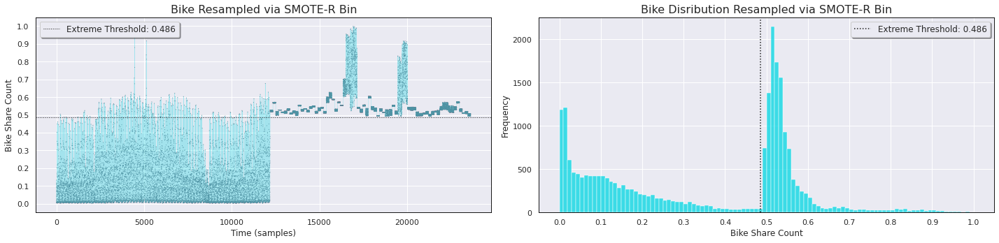

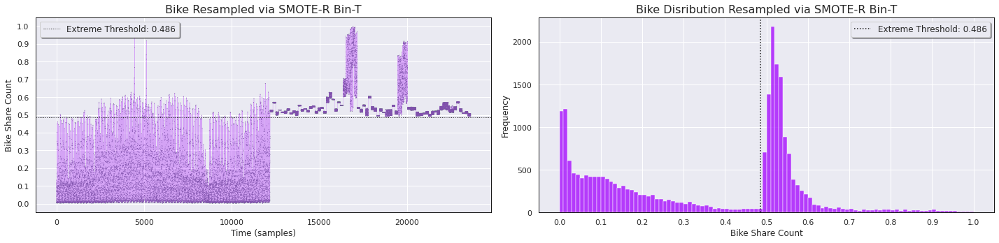

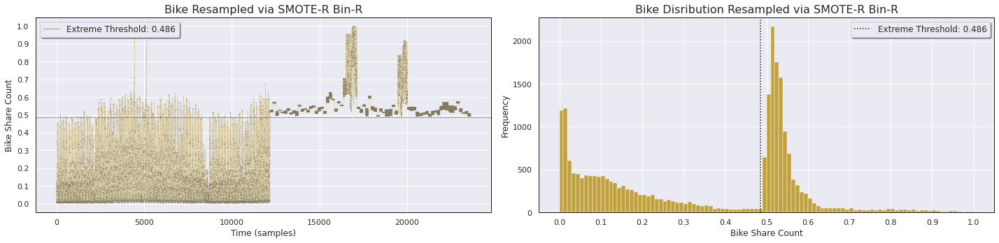

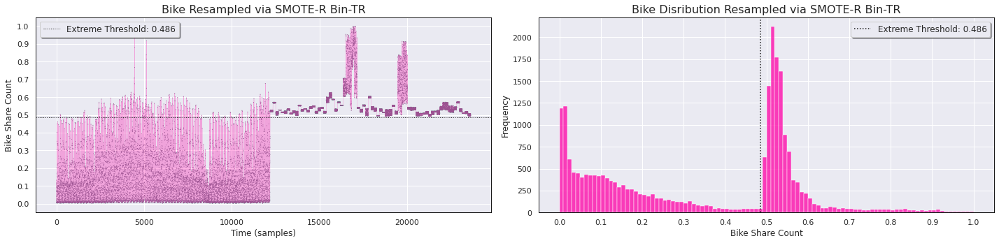

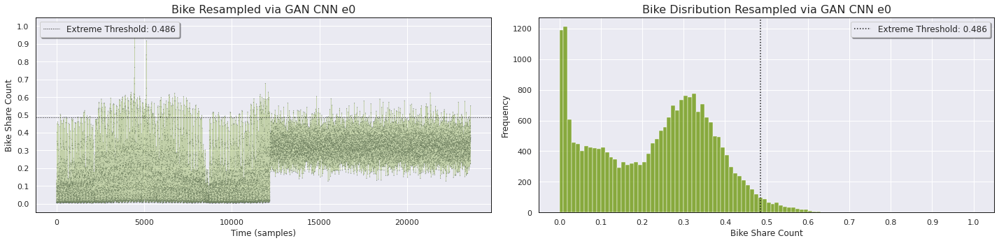

...

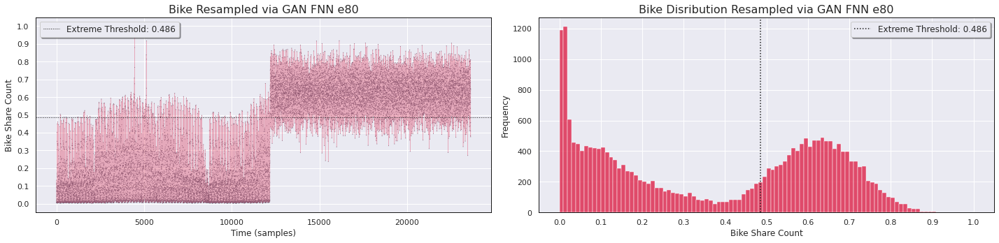

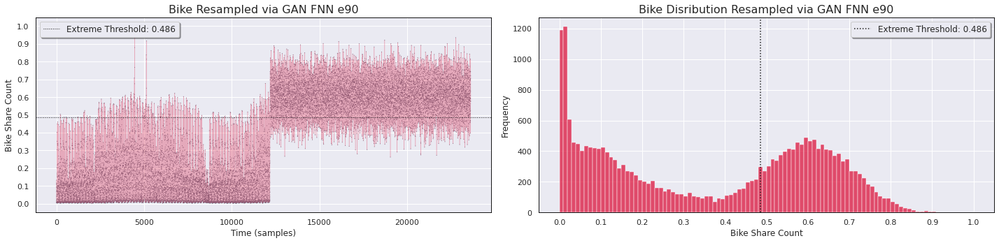

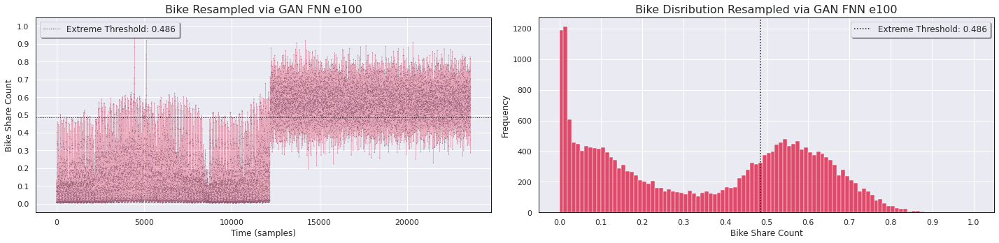

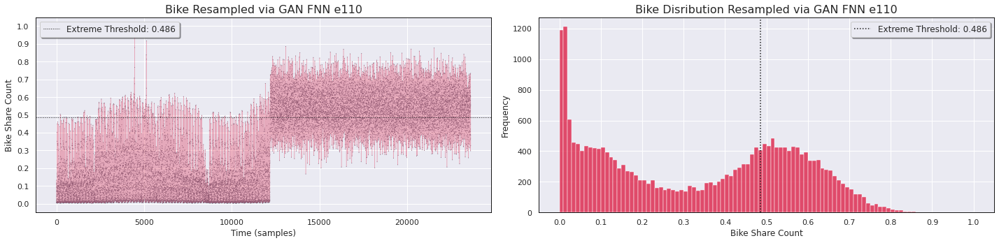

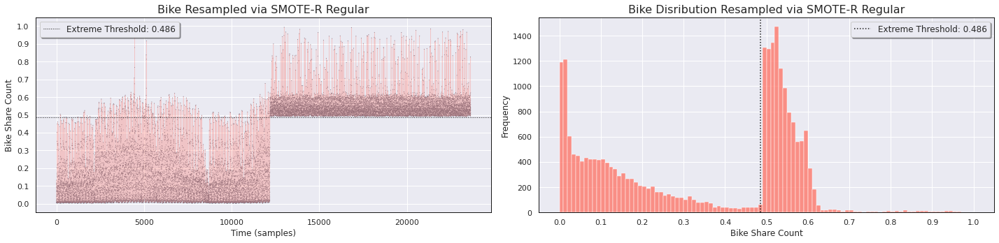

In [11]:
#import plt_utils as pu
#importlib.reload(pu)
#only plots first step out in each embedded
pu.PlotResampledResults(resampling_results, k_X.shape[0], N_STEPS_OUT,EXTREMES_THRESHOLD, TVAR, DATA_NAME)

### Remove Bad GANs

Save time training the forecasters by removing GANs that will clearly generate bad results

In [12]:
all_resampling_results = resampling_results.copy() #save a copy just incase
to_delete = ['GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90']
print(resampling_results.keys())
for d in to_delete:
    del resampling_results[d]
print(resampling_results.keys())

dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e0', 'GAN_CNN_e10', 'GAN_CNN_e20', 'GAN_CNN_e30', 'GAN_CNN_e40', 'GAN_CNN_e50', 'GAN_CNN_e60', 'GAN_CNN_e70', 'GAN_CNN_e80', 'GAN_CNN_e90', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e0', 'GAN_FNN_e10', 'GAN_FNN_e20', 'GAN_FNN_e30', 'GAN_FNN_e40', 'GAN_FNN_e50', 'GAN_FNN_e60', 'GAN_FNN_e70', 'GAN_FNN_e80', 'GAN_FNN_e90', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])
dict_keys(['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r', 'SMOTER_bin_tr', 'GAN_CNN_e100', 'GAN_CNN_e110', 'GAN_FNN_e100', 'GAN_FNN_e110', 'SMOTER_regular'])


# **Running Forecasting Experiments**

**Init Evaluator object for model eval metrics**

In [13]:
import evaluator as ev
importlib.reload(ev)

#NOTE: evaler_params must include CaseWeight else errors in MODEL_LSTM
evaluator_params = { "RMSE": {},
                     "RMSERare": {},
                     "Utility": {'m':0.5},
                     "CaseWeight": {'m':0.5},
                     "PrecisionRecall": {},
                     "FScore": {'beta':0.5},
                     #"RelevanceROC": {},
                   }
EVALERS = {}
for f in FORECASTERS:
    EVALERS[f] = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)

#EVALER = ev.Evaluator(evaluator_params, RELEVANCE_THRESHOLD, RELEVANCE_FUNCTION)
RECORDER.save_param_dict({"Evaluator":evaluator_params})

**Train and evaluate an LSTM for each resampling strategy**

In [14]:
NUM_EXPERIMENTS = 10

def main(time_step, X_train, X_test, Y_train, Y_test, resampling_results, evalers, recorder, train_params):   
    recorder.log_print(f"Starting forecasting experiments with num_exps: {train_params['num_exp']} and epochs: {train_params['epochs']}")
    recorder.save_param_dict({"Forecasting":{"NumExp":train_params['num_exp'], "nEpochs": train_params['epochs'], "hidden":train_params['hidden']}})
    
    forecast_results = {}
    for f in FORECASTERS:
        print(f"############## no_resample : {f} ##############")
        if f == "LSTM":
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
        else:
            best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_train, X_test, Y_train, Y_test, "no_resample", train_params, evalers[f], recorder.log_print)
    
        results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_train,'Y_train':Y_train,'model':best_model}
        forecast_results[f] = {}
        forecast_results[f]['no_resample'] = results
    
    
    for key in resampling_results.keys():
        res = resampling_results[key]
        X_res = res[:,:(N_STEPS_IN*N_FVARS)]
        X_res = X_res.reshape((X_res.shape[0],N_STEPS_IN,N_FVARS))
        Y_res = res[:,(N_STEPS_IN*N_FVARS):]
        for f in FORECASTERS:
            print(f"############## {key} : {f} ##############")
            if f == "LSTM":
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_LSTM(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
            else:
                best_predict_test, best_predict_train, best_cw, best_model = fmod.MODEL_CNN(X_res, X_test, Y_res, Y_test, key, train_params, evalers[f], recorder.log_print)
        
            results = {'predict_test':best_predict_test,'predict_train':best_predict_train,'X_train':X_res,'Y_train':Y_res,'model':best_model}
            forecast_results[f][key] = results
    
    return forecast_results

TRAIN_PARAMS = {
        'num_exp': NUM_EXPERIMENTS, 
        'n_steps_in': N_STEPS_IN,
        'n_steps_out': N_STEPS_OUT,
        'epochs': 100,
        'hidden': 100,
        'forecast_dir': FORECAST_DIR,
        'n_fvars': N_FVARS
    }

forecast_results = main(N_STEPS_IN, X_train, X_test, Y_train, Y_test, resampling_results, EVALERS, RECORDER, TRAIN_PARAMS)

print("$$$$ FINISHED FORECASTING EXPERIMENTS $$$$")

LOG: 22:16:24:030 Starting forecasting experiments with num_exps: 10 and epochs: 100

############## no_resample : LSTM ##############
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               40800     
                                                                 
 dense (Dense)               (None, 5)                 505       
                                                                 
Total params: 41,305
Trainable params: 41,305
Non-trainable params: 0
_________________________________________________________________
LOG: 22:16:24:151 Starting LSTM forecaster training on no_resample

LOG: 22:16:24:152 	Experiment 1 in progress



2023-10-24 22:16:24.035499: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:967] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-24 22:16:24.035622: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-10-24 22:16:24.035724: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2023-10-24 22:16:24.035768: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2023-10-24 22:16:24.035811: W tensorf

164/164 [==============================] - 0s 2ms/step
LOG: 22:17:58:475 	Experiment 2 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:19:38:898 	Experiment 3 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:21:21:774 	Experiment 4 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:23:05:195 	Experiment 5 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:24:49:484 	Experiment 6 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:26:35:272 	Experiment 7 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:28:24:726 	Experiment 8 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:30:12:830 	Experiment 9 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:31:59:507 	Experiment 10 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 22:33:46:915 Total time for 10 no_resam

164/164 [==============================] - 0s 836us/step
LOG: 23:12:59:873 	Experiment 2 in progress

164/164 [==============================] - 0s 776us/step
LOG: 23:13:43:897 	Experiment 3 in progress

164/164 [==============================] - 0s 830us/step
LOG: 23:14:27:486 	Experiment 4 in progress

164/164 [==============================] - 0s 808us/step
LOG: 23:15:11:241 	Experiment 5 in progress

164/164 [==============================] - 0s 915us/step
LOG: 23:15:55:035 	Experiment 6 in progress

164/164 [==============================] - 0s 776us/step
LOG: 23:16:38:670 	Experiment 7 in progress

164/164 [==============================] - 0s 833us/step
LOG: 23:17:22:610 	Experiment 8 in progress

164/164 [==============================] - 0s 819us/step
LOG: 23:18:06:302 	Experiment 9 in progress

164/164 [==============================] - 0s 824us/step
LOG: 23:18:50:003 	Experiment 10 in progress

164/164 [==============================] - 0s 807us/step
LOG: 23:19:33:587 Total 

164/164 [==============================] - 0s 2ms/step
LOG: 00:12:00:363 	Experiment 4 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:15:26:705 	Experiment 5 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:18:52:831 	Experiment 6 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:22:19:166 	Experiment 7 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:25:45:138 	Experiment 8 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:29:11:128 	Experiment 9 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:32:36:870 	Experiment 10 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 00:36:03:212 Total time for 10 SMOTER_bin_r experiments 2067.9356672763824

############## SMOTER_bin_r : CNN ##############
Model: "sequential_7"
_________________________________________________________________
 Layer (type)             

164/164 [==============================] - 0s 793us/step
LOG: 01:18:59:449 	Experiment 3 in progress

164/164 [==============================] - 0s 763us/step
LOG: 01:19:40:378 	Experiment 4 in progress

164/164 [==============================] - 0s 783us/step
LOG: 01:20:22:038 	Experiment 5 in progress

164/164 [==============================] - 0s 822us/step
LOG: 01:21:03:256 	Experiment 6 in progress

164/164 [==============================] - 0s 892us/step
LOG: 01:21:44:535 	Experiment 7 in progress

164/164 [==============================] - 0s 793us/step
LOG: 01:22:25:598 	Experiment 8 in progress

164/164 [==============================] - 0s 856us/step
LOG: 01:23:06:825 	Experiment 9 in progress

164/164 [==============================] - 0s 817us/step
LOG: 01:23:48:078 	Experiment 10 in progress

164/164 [==============================] - 0s 822us/step
LOG: 01:24:29:367 Total time for 10 SMOTER_bin_tr experiments 414.68069672584534

############## GAN_CNN_e100 : LSTM #########

164/164 [==============================] - 0s 2ms/step
LOG: 07:07:19:296 	Experiment 5 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 13:49:40:406 	Experiment 6 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 13:52:41:413 	Experiment 7 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 13:55:53:993 	Experiment 8 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 13:59:01:154 	Experiment 9 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 14:02:11:635 	Experiment 10 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 14:05:28:670 Total time for 10 GAN_CNN_e110 experiments 43298.28463959694

############## GAN_CNN_e110 : CNN ##############
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_6 (Conv1D)           (None, 4, 32)             96   

164/164 [==============================] - 0s 764us/step
LOG: 14:48:02:104 	Experiment 5 in progress

164/164 [==============================] - 0s 809us/step
LOG: 14:48:43:882 	Experiment 6 in progress

164/164 [==============================] - 0s 811us/step
LOG: 14:49:25:784 	Experiment 7 in progress

164/164 [==============================] - 0s 770us/step
LOG: 14:50:07:597 	Experiment 8 in progress

164/164 [==============================] - 0s 829us/step
LOG: 14:50:49:452 	Experiment 9 in progress

164/164 [==============================] - 0s 781us/step
LOG: 14:51:31:390 	Experiment 10 in progress

164/164 [==============================] - 0s 787us/step
LOG: 14:52:13:845 Total time for 10 GAN_FNN_e100 experiments 419.614385843277

############## GAN_FNN_e110 : LSTM ##############
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 100)      

164/164 [==============================] - 0s 2ms/step
LOG: 15:52:03:123 	Experiment 7 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 15:55:22:716 	Experiment 8 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 15:58:41:248 	Experiment 9 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 16:01:59:827 	Experiment 10 in progress

164/164 [==============================] - 0s 2ms/step
LOG: 16:05:18:477 Total time for 10 SMOTER_regular experiments 1984.5010323524475

############## SMOTER_regular : CNN ##############
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_9 (Conv1D)           (None, 4, 32)             96        
                                                                 
 max_pooling1d_9 (MaxPooling  (None, 2, 32)            0         
 1D)                                                     

## *SAVE EVALER RESULTS ---- DON'T FORGET*

In [15]:
for f in FORECASTERS:
    RECORDER.save_all_evaler_exps(EVALERS[f].getResultsDf(), f)

### Plot Actual vs Predicted

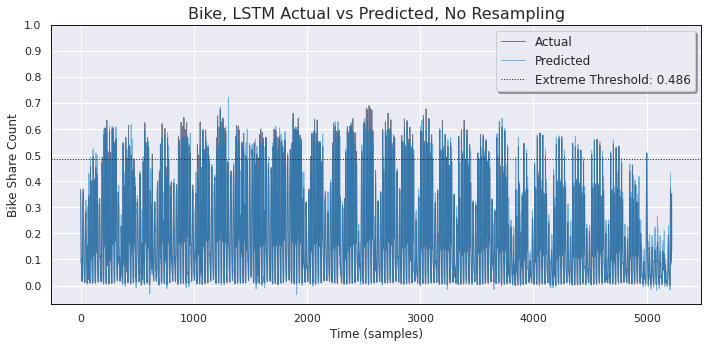

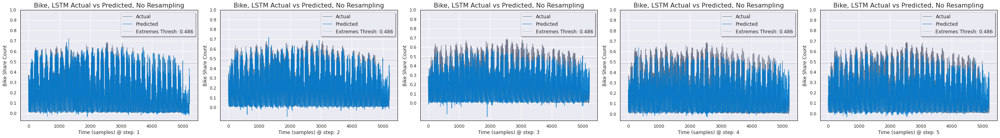

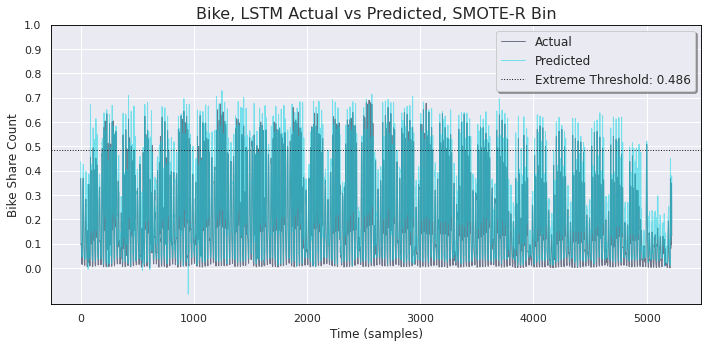

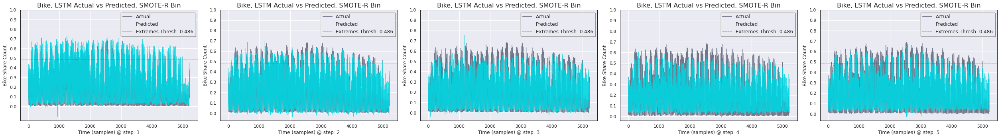

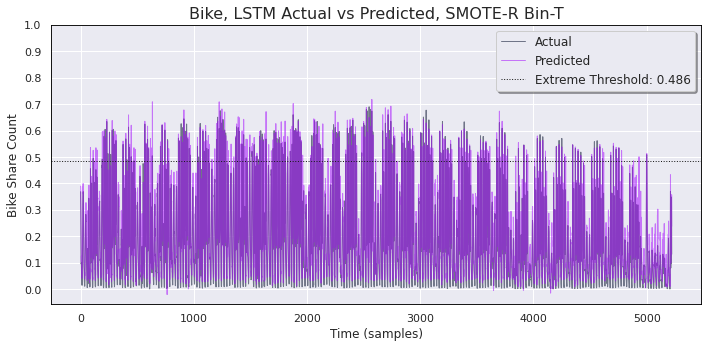

...

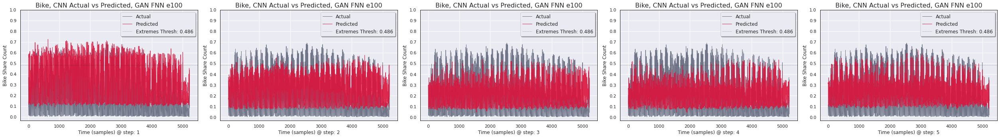

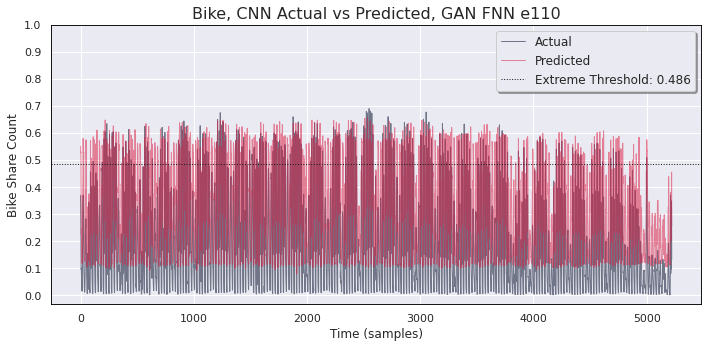

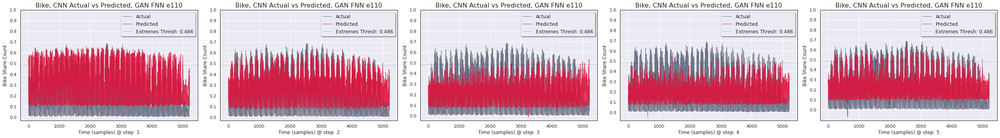

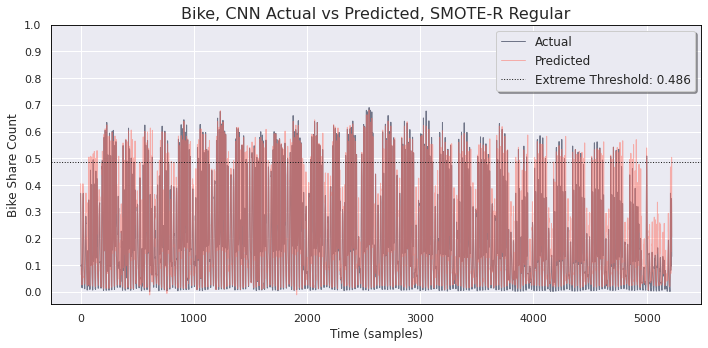

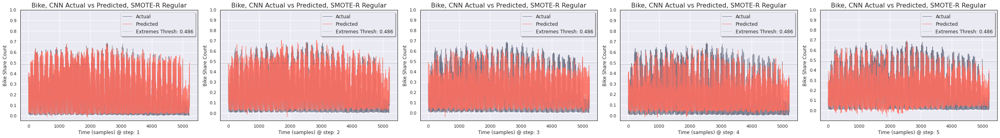

In [16]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
#print(forecast_results)
#PLOT PRED VS ACTUAL + SAVE_EVAL_RESULTS
for f in FORECASTERS:
    for key in forecast_results[f].keys():
        y_predict_test = forecast_results[f][key]['predict_test']
        #Plot a single Actual vs Predicted figure for only one chosen step out: 0 for first step
        pu.PlotPredVsActual1D(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f, 0)
        #Plot a Actual vs Predicted for all steps out in one figure
        pu.PlotPredVsActualSteps(Y_test, y_predict_test, key, EXTREMES_THRESHOLD, TVAR, DATA_NAME, N_STEPS_OUT, f)
        #Save forecasting model
        RECORDER.save_LSTM(forecast_results[f][key]['model'], key)
        #TODO: save CNN and LSTM with same function

### Record KS Statistic and Plot Extremes Distribution for Each Resampling Strategy

KS statistic: 0.11524603575220616, p-value: 0.00014932379097894592


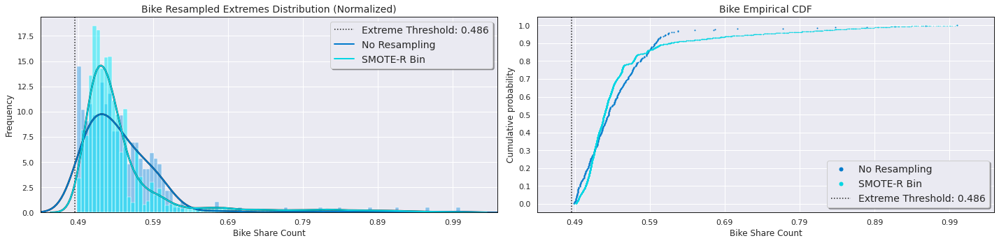

KS statistic: 0.11651668378270175, p-value: 0.00012098133703720241


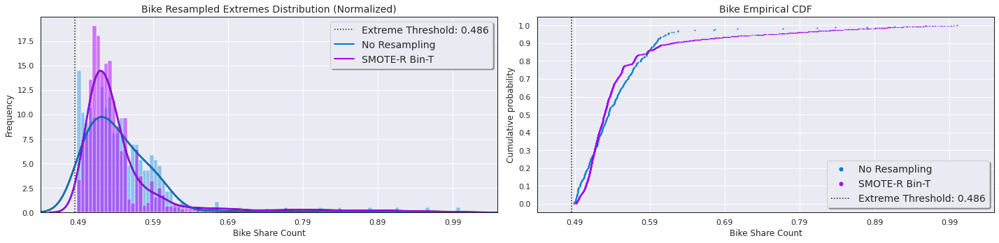

KS statistic: 0.1119423508729177, p-value: 0.0002553111294744332


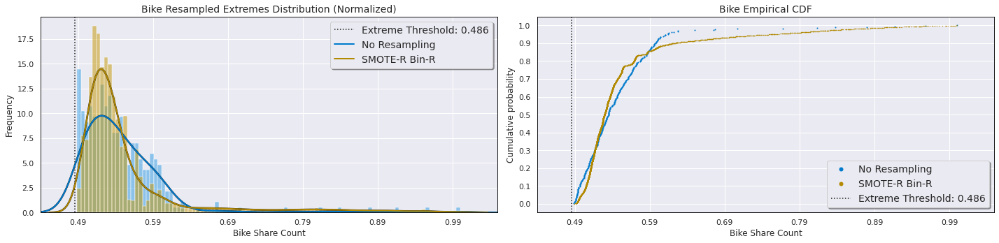

KS statistic: 0.11575429496440437, p-value: 0.0001373048906603613


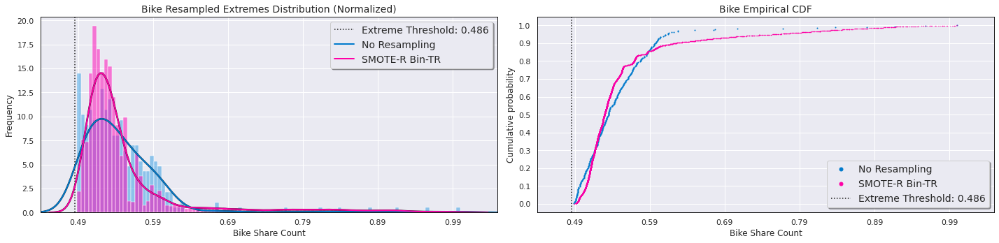

KS statistic: 0.9664258817659107, p-value: 0.0


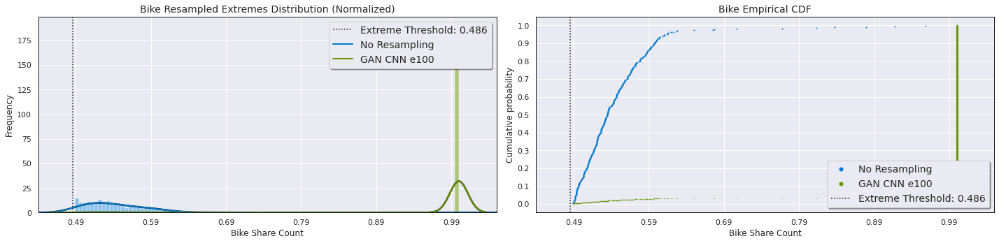

KS statistic: 0.9664258817659107, p-value: 0.0


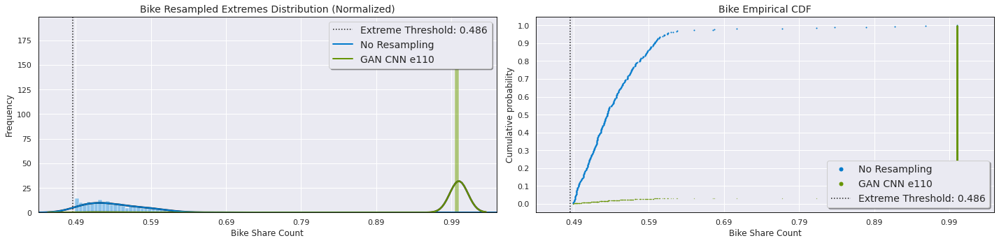

KS statistic: 0.4159311925874756, p-value: 1.7501515946799744e-55


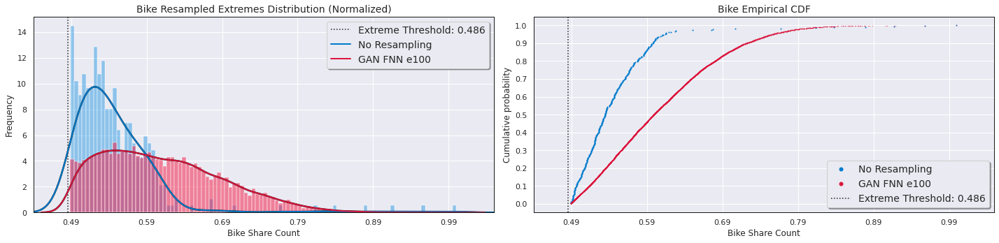

KS statistic: 0.3465793333266819, p-value: 5.712638196529363e-38


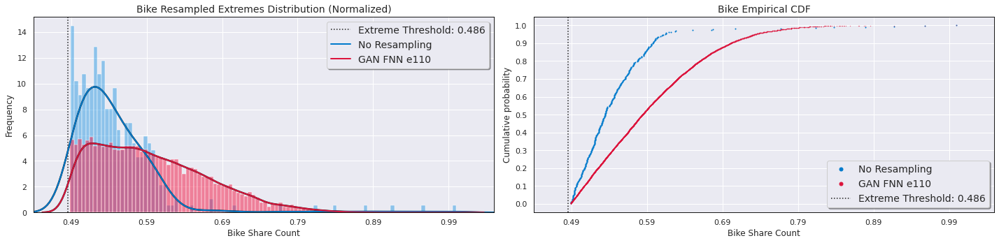

KS statistic: 0.03797851895297862, p-value: 0.6723488095117103


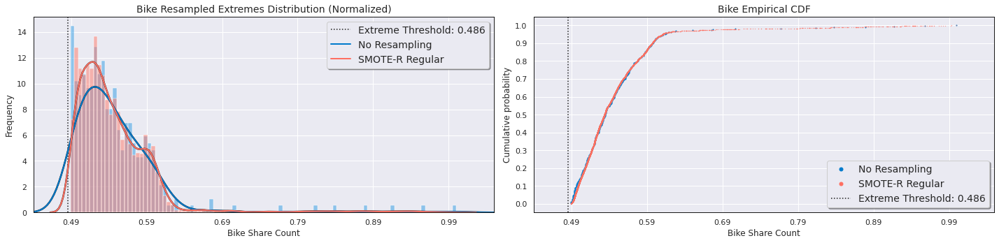

In [17]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
from scipy.stats import ks_2samp
import scipy.stats as stats

step_out = 0
#get extremes for original data
y_orig_rel = RELEVANCE_FUNCTION.__call__(Y_train[:,step_out])
rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_orig_rel]
y_orig_rare = Y_train[rare_mask]
ks_results = []
for key, res in resampling_results.items():
    #get extremes for resampled data
    y_res = res[:,(N_STEPS_IN*N_FVARS):]
    y_rel = RELEVANCE_FUNCTION.__call__(y_res[:,step_out])
    rare_mask = [val >= RELEVANCE_THRESHOLD for val in y_rel]
    y_rare = y_res[rare_mask]

    # Perform the Kolmogorov-Smirnov test
    statistic, p_value = ks_2samp(y_orig_rare[:,step_out], y_rare[:,step_out])
    print(f"KS statistic: {statistic}, p-value: {p_value}")
    ks_results.append({'Res':key, 'ksStat':statistic, 'pValue':p_value})
    #Plot extremes hist and cdf for each strategy vs original data
    pu.PlotExremesDistribution(y_orig_rare, y_rare, key, step_out, EXTREMES_THRESHOLD, TVAR, DATA_NAME)
    

ks_df = pd.DataFrame(ks_results)
RECORDER.save_ks(ks_df)

### Prepare Data for Comparison Plots

If we include all strategies on the comparison plots they will be really cluttered and almost useless to the reader. In the following cell we choose the best CNN_GAN, FNN_GAN, and SMOTER_bin approach from the RMSERare of the forecasting results and only include these on the comparison plots. 

Later we'll also use this cell to load the base resampling results / eval metrics to include on the comparison plots along side the next generation of resampling strategies

In [18]:
def calculate_mean(lst):
    return sum(lst) / len(lst)

#Combine EVALER from loaded experiments
#Combine resampling results from loaded experiments
#np.loadtxt('test.txt', delimiter=',', dtype=float)

#TODO: come up with a way to make a copy of evaler so we don't have to filter best strategies for the clustered bar plots

#best_resampling_results will contain best GANs, best SMOTERs
best_resampling_results = resampling_results.copy()
best_cnn_gan = ""
best_fnn_gan = ""
best_bin = ""

def get_best_resampling(forecaster, best, evaler, metric, recorder):
    exp_sum = evaler.getExperimentSummaryDf(metric)
    #get best CNN_GAN if used
    cnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_CNN")]
    if not cnn_exp_sum.empty:
        #apply mean to all rows
        cnn_exp_sum[f"{metric}_Test_Mean"] = cnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = cnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_cnn_gan = cnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best CNN_GAN for {forecaster}: {best_cnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_CNN" in key and key != best_cnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['cnn_gan'] = best_cnn_gan
        ekey = int(best_cnn_gan.split('_')[-1][1:])
        recorder.save_gan(CNN_GENS[ekey], CNN_DISCS[ekey], "CNN", best_cnn_gan)
    
    #get best FNN_GAN if used
    fnn_exp_sum = exp_sum[exp_sum['Res'].str.contains("GAN_FNN")]
    if not fnn_exp_sum.empty:
        #apply mean to all rows
        fnn_exp_sum[f"{metric}_Test_Mean"] = fnn_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = fnn_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_fnn_gan = fnn_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best FNN_GAN for {forecaster}: {best_fnn_gan}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "GAN_FNN" in key and key != best_fnn_gan]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['fnn_gan'] = best_fnn_gan
        ekey = int(best_fnn_gan.split('_')[-1][1:])
        RECORDER.save_gan(FNN_GENS[ekey], FNN_DISCS[ekey], "FNN", best_fnn_gan)
    #get best SMOTER_bin if used
    bin_exp_sum = exp_sum[exp_sum['Res'].str.contains("SMOTER_bin")] 
    if not bin_exp_sum.empty:
        bin_exp_sum[f"{metric}_Test_Mean"] = bin_exp_sum[f"{metric}_Test_Mean"].apply(calculate_mean)
        max_cw_idx = bin_exp_sum[f"{metric}_Test_Mean"].idxmin()
        best_bin = bin_exp_sum.at[max_cw_idx, "Res"]
        print(f"Best SMOTER bin for {forecaster}: {best_bin}")
        keys_to_delete = [key for key in best['resampling_results'].keys() if "SMOTER_bin" in key and key != best_bin]
        print(f"deleting keys: {keys_to_delete}")
        for key in keys_to_delete:
            del best['resampling_results'][key]
        best['bin'] = best_bin
    return best #?
                                                         

BEST_RESULTS = {}
for f in FORECASTERS:
    BEST_RESULTS[f] = {'resampling_results': resampling_results.copy(), 'cnn_gan': "", 'fnn_gan': "", "bin": ""}
    #do below stuff with argument 'f'
    BEST_RESULTS[f] = get_best_resampling(f, BEST_RESULTS[f], EVALERS[f], 'RMSERare', RECORDER) #?
    RECORDER.save_resample_results_np(BEST_RESULTS[f]['resampling_results'], f)


#load all resampling results
#COMBINE_RESAMPLING_RESULTS_DIR = Path("Sessions/Bike/2023-October-13 13-41-03-532984").joinpath("resample_results")

#add loaded resampling results to best_resampling_results
#best_resampling_results.update({file.stem: np.loadtxt(file, delimiter=',', dtype=float)
#                  for file in COMBINE_RESAMPLING_RESULTS_DIR.iterdir() if file.is_file()})

Best CNN_GAN for LSTM: GAN_CNN_e110
deleting keys: ['GAN_CNN_e100']
Best FNN_GAN for LSTM: GAN_FNN_e100
deleting keys: ['GAN_FNN_e110']
Best SMOTER bin for LSTM: SMOTER_bin_t
deleting keys: ['SMOTER_bin', 'SMOTER_bin_r', 'SMOTER_bin_tr']
LOG: 16:13:06:359 Saving resample results numpy style

Best CNN_GAN for CNN: GAN_CNN_e100
deleting keys: ['GAN_CNN_e110']
Best FNN_GAN for CNN: GAN_FNN_e100
deleting keys: ['GAN_FNN_e110']
Best SMOTER bin for CNN: SMOTER_bin_tr
deleting keys: ['SMOTER_bin', 'SMOTER_bin_t', 'SMOTER_bin_r']
LOG: 16:13:07:105 Saving resample results numpy style



### Compare KDEs and CDFs

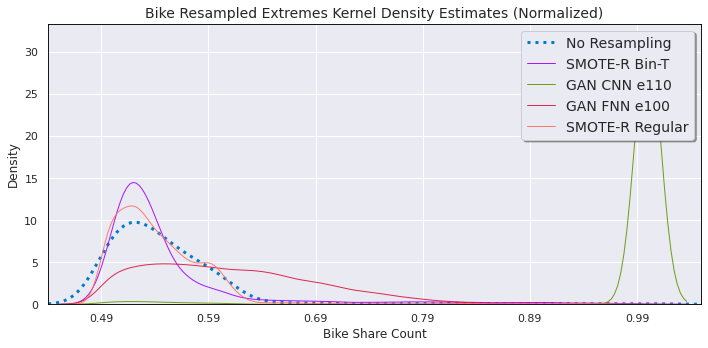

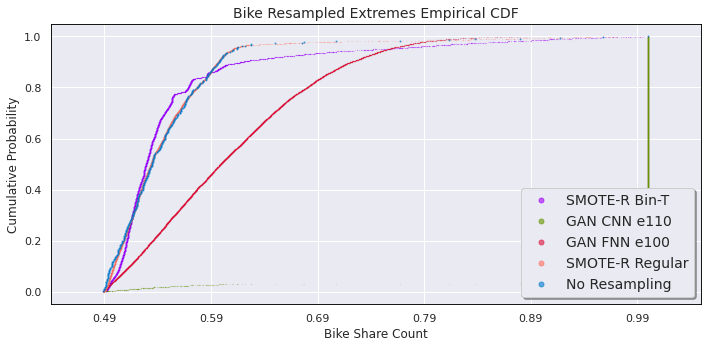

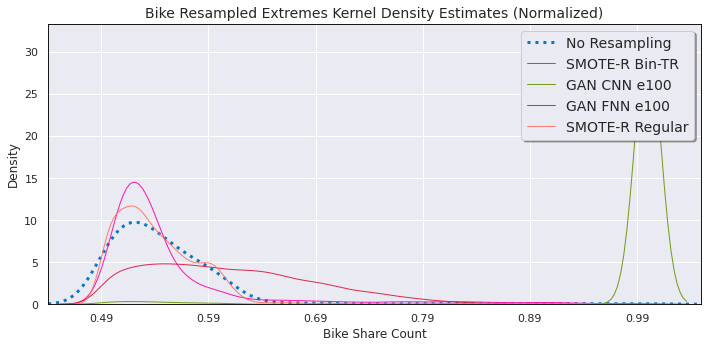

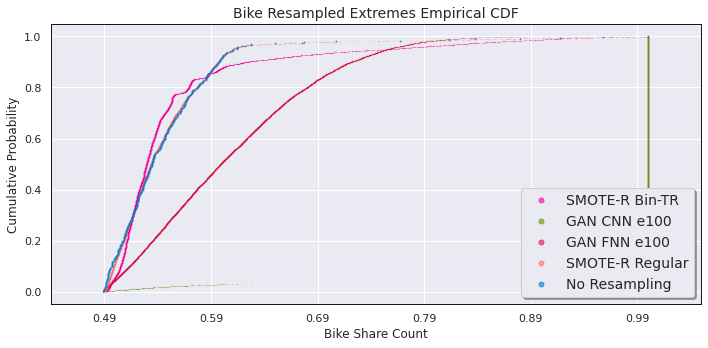

In [19]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)
step_out = 0

#compare KDE, CDF
for f in FORECASTERS:
    pu.PlotKDECompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    
    pu.PlotCDFCompare(Y_train, BEST_RESULTS[f]['resampling_results'], RELEVANCE_FUNCTION, RELEVANCE_THRESHOLD, step_out, N_STEPS_IN*N_FVARS, EXTREMES_THRESHOLD, TVAR, DATA_NAME, f)    

### Plot Eval Results Aggregated Over All Steps

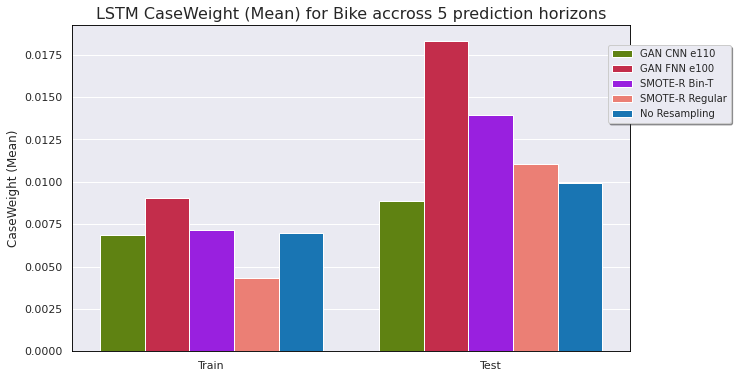

<Figure size 720x432 with 0 Axes>

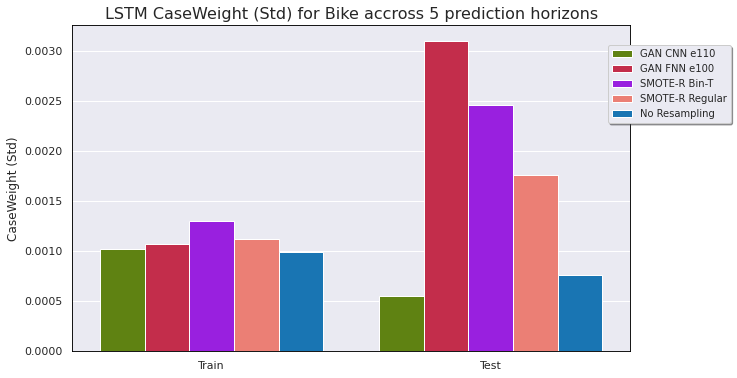

<Figure size 720x432 with 0 Axes>

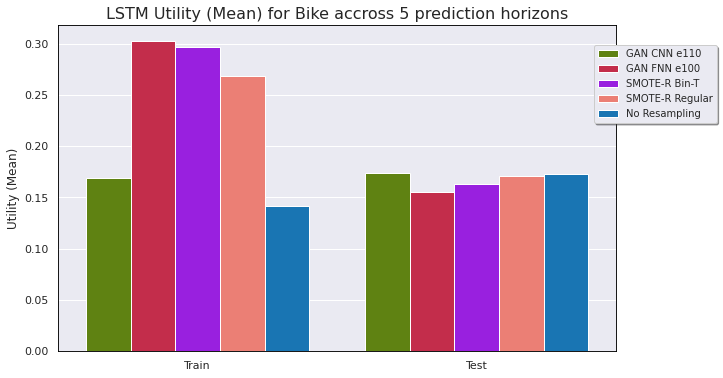

<Figure size 720x432 with 0 Axes>

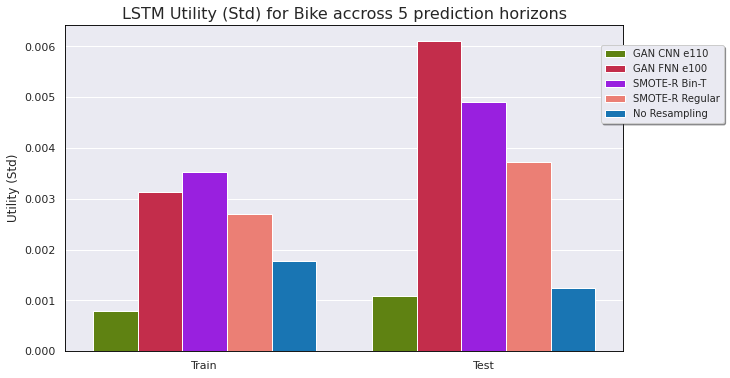

<Figure size 720x432 with 0 Axes>

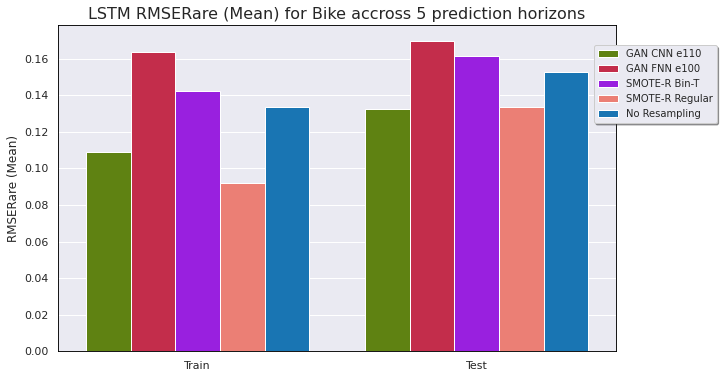

<Figure size 720x432 with 0 Axes>

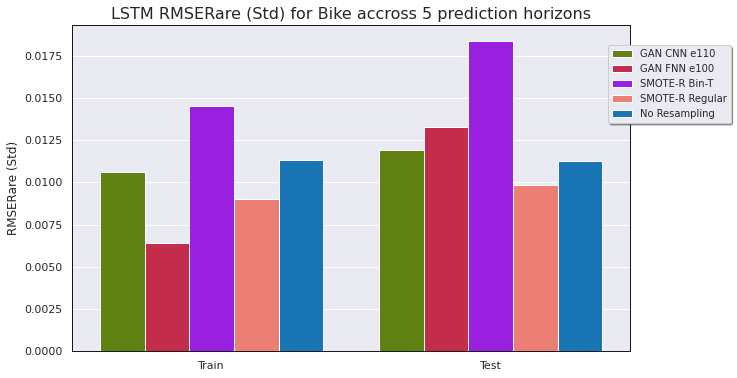

<Figure size 720x432 with 0 Axes>

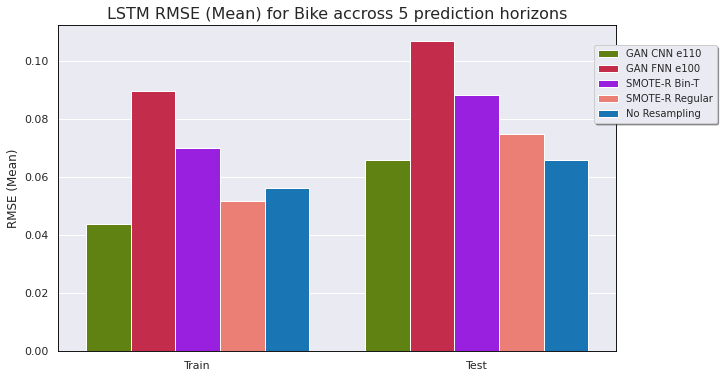

<Figure size 720x432 with 0 Axes>

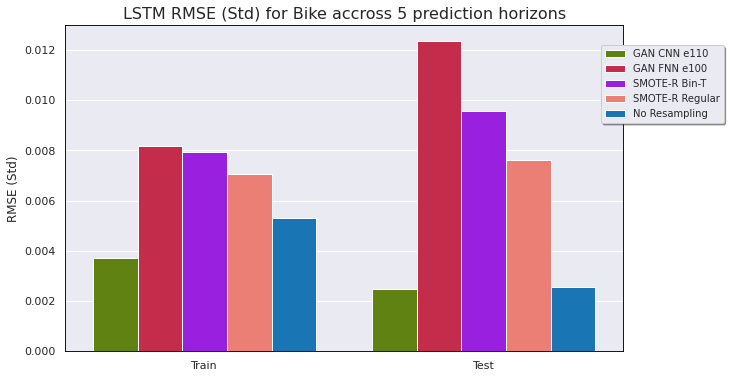

<Figure size 720x432 with 0 Axes>

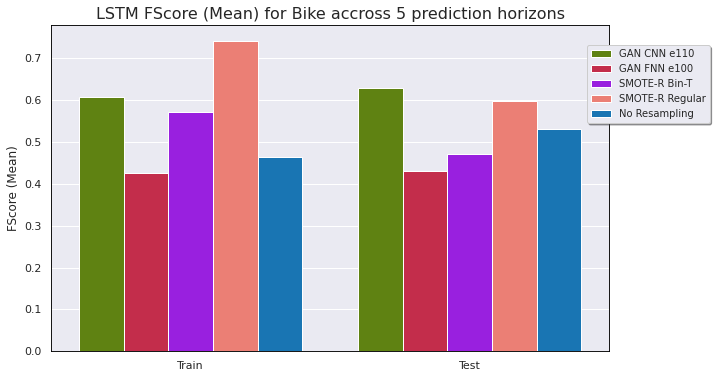

<Figure size 720x432 with 0 Axes>

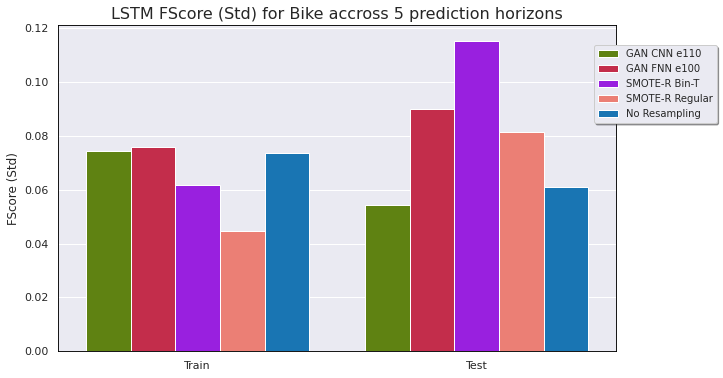

<Figure size 720x432 with 0 Axes>

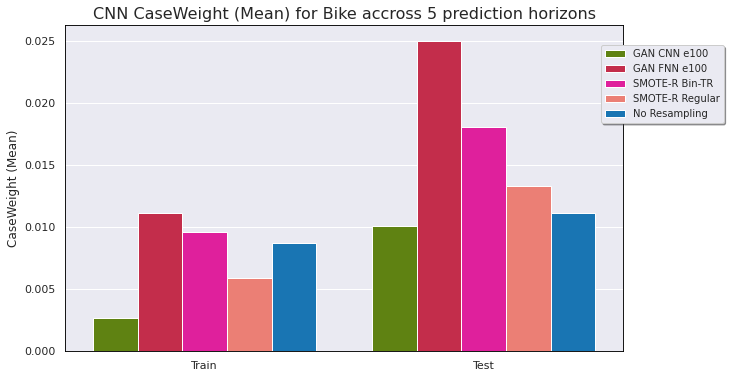

<Figure size 720x432 with 0 Axes>

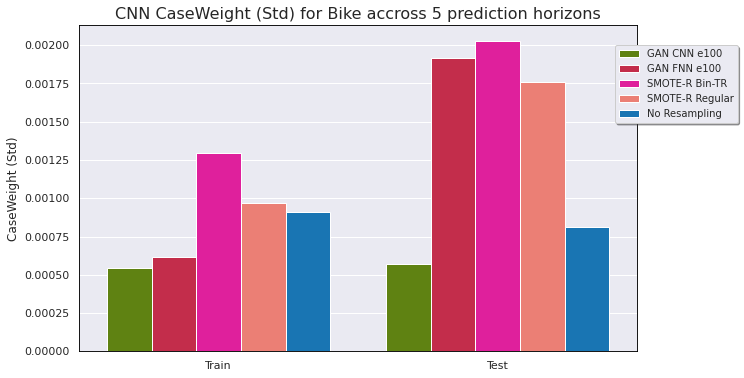

<Figure size 720x432 with 0 Axes>

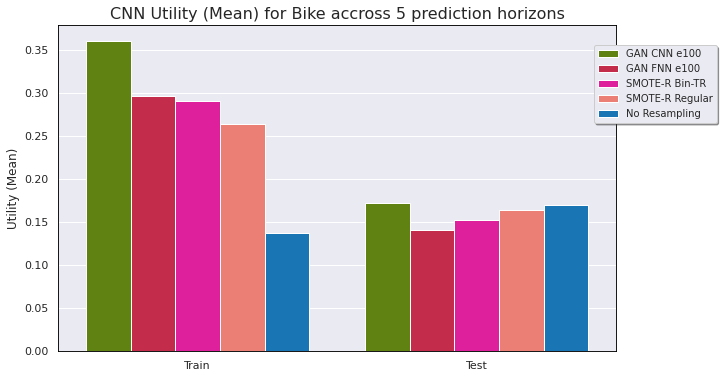

<Figure size 720x432 with 0 Axes>

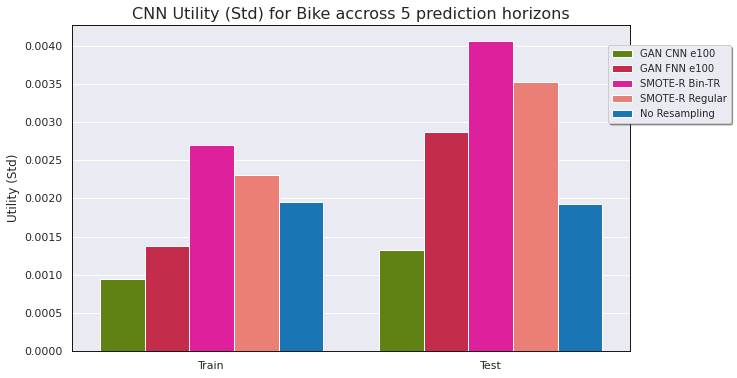

<Figure size 720x432 with 0 Axes>

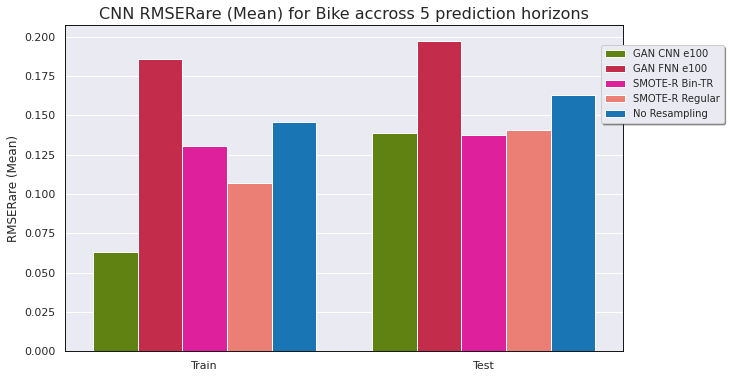

<Figure size 720x432 with 0 Axes>

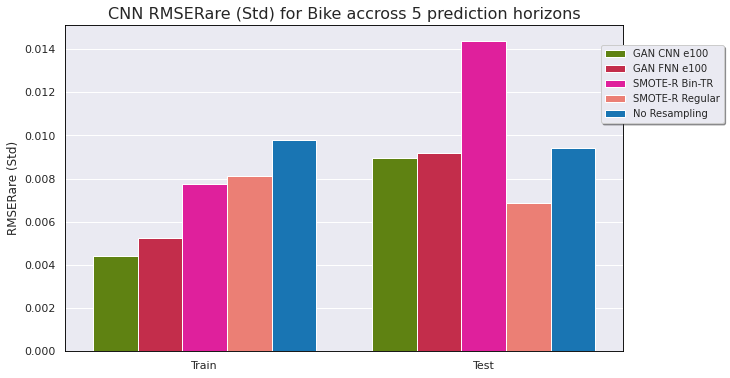

<Figure size 720x432 with 0 Axes>

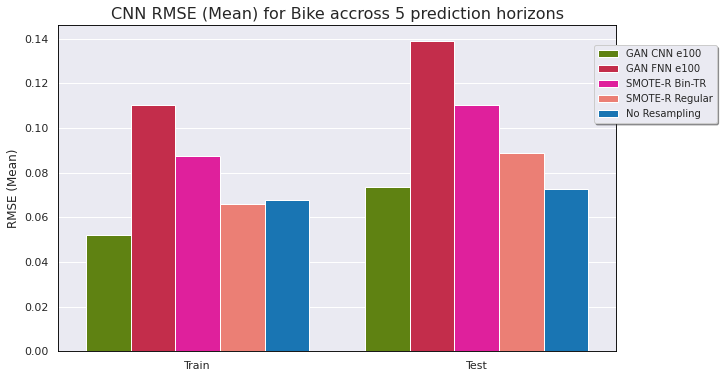

<Figure size 720x432 with 0 Axes>

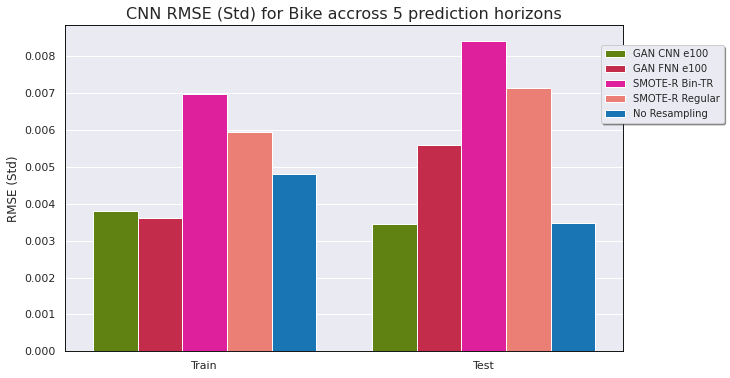

<Figure size 720x432 with 0 Axes>

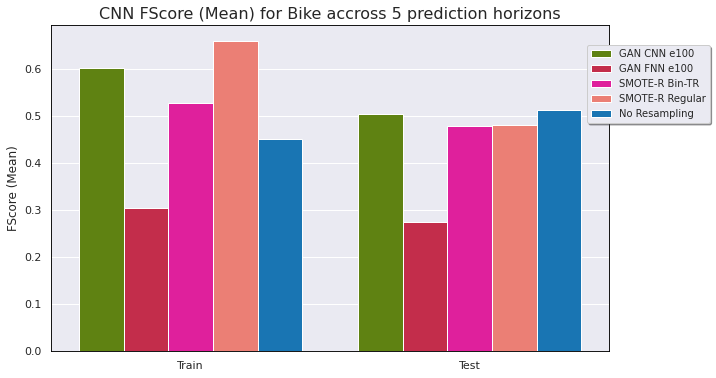

<Figure size 720x432 with 0 Axes>

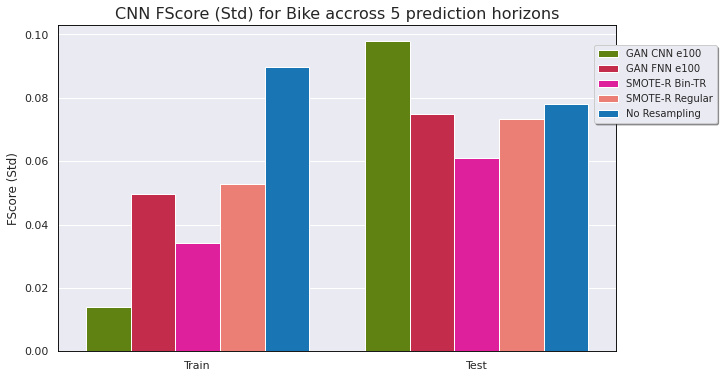

<Figure size 720x432 with 0 Axes>

In [20]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)


def calculate_mean(lst):
    return sum(lst) / len(lst)

#Just plot these metrics:
plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]

ts = ["Train", "Test"] #one cluster for train, one for test results

#aggs options: 
aggs = ["Mean", "Std"]
## for "Mean" we get the mean of the eval metrics over all experiments and plot its average over time steps
## for "Std" we get the std of the eval metrics over all experiments and plot its average over time steps

#for f in FORECASTERS: EVALER[f], get best_cnn_gan, best_fnn_gan, best_bin from dict
#pass an argument to plotting function to specify f
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        df_results = EVALERS[f].getExperimentSummaryDf(metric, True)
        df_results_train = EVALERS[f].getExperimentSummaryDf(metric, False)
        df_results[f"{metric}_Train_Mean"] = df_results_train[f"{metric}_Train_Mean"]
        df_results[f"{metric}_Train_Std"] = df_results_train[f"{metric}_Train_Std"]
        # Replace with the mean of the steps out lists
        df_results[f"{metric}_Train_Mean"] = df_results[f"{metric}_Train_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Test_Mean"] = df_results[f"{metric}_Test_Mean"].apply(calculate_mean)
        df_results[f"{metric}_Train_Std"] = df_results[f"{metric}_Train_Std"].apply(calculate_mean)
        df_results[f"{metric}_Test_Std"] = df_results[f"{metric}_Test_Std"].apply(calculate_mean)
        for a in aggs:
            #remove any GAN_CNNs, GAN_FNNs, and SMOTER_bin strategies from the dataframe that aren't the best
            filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
            filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
            '''
            filtered_df = df_results
            if best_cnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_CNN')) & (filtered_df['Res'] == best_cnn_gan)) | (~filtered_df['Res'].str.contains('GAN_CNN'))]
            if best_fnn_gan:
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('GAN_FNN')) & (filtered_df['Res'] == best_fnn_gan)) | (~filtered_df['Res'].str.contains('GAN_FNN'))]
            '''
            pu.PlotTrainTestBarResults(filtered_df, metric, a, DATA_NAME, N_STEPS_OUT, f)


### Plot Train and Test Eval Results Clustered By Steps Out

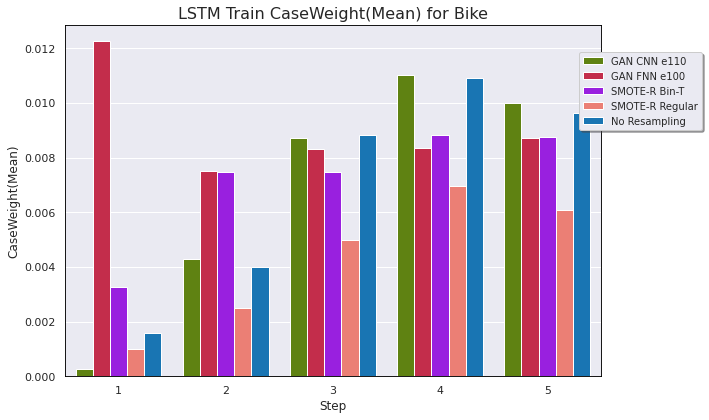

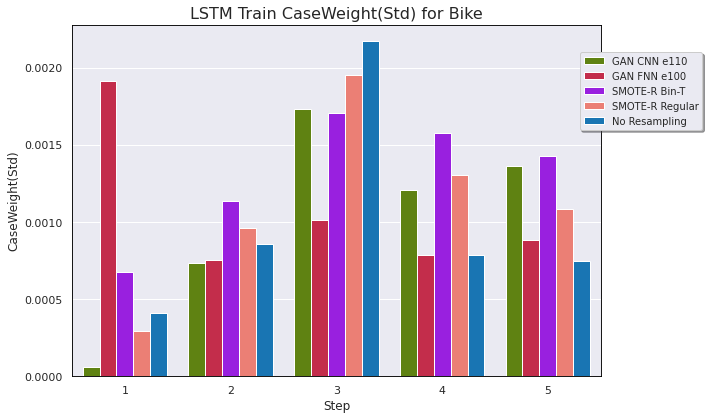

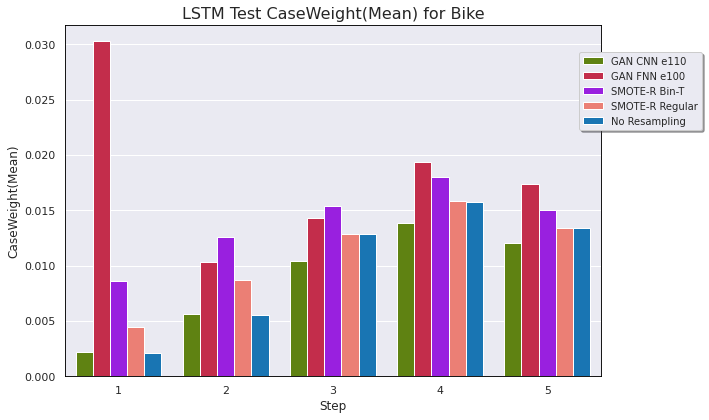

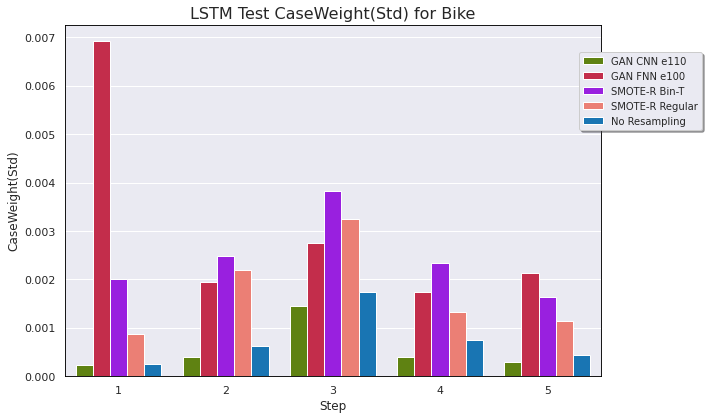

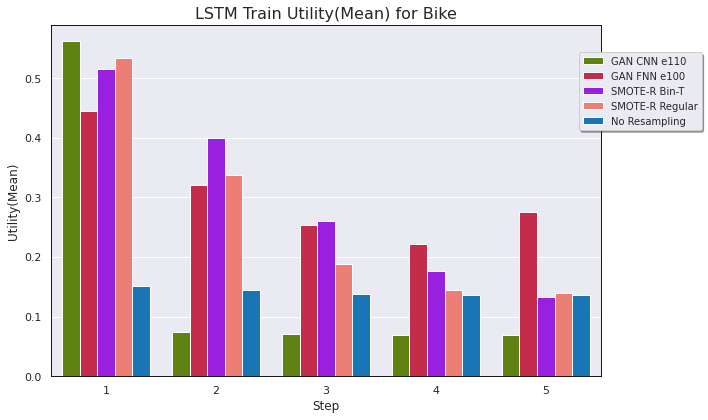

...

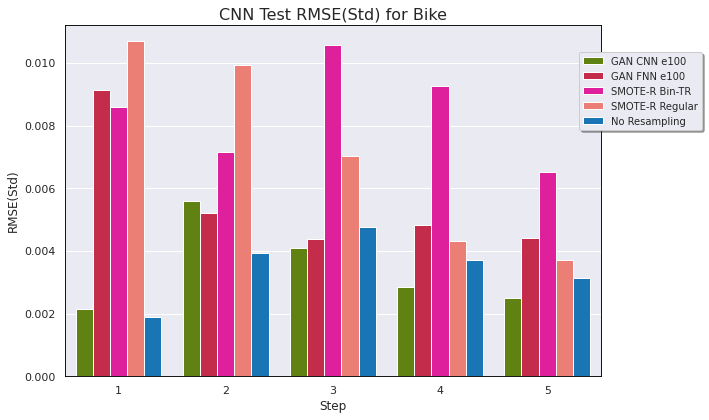

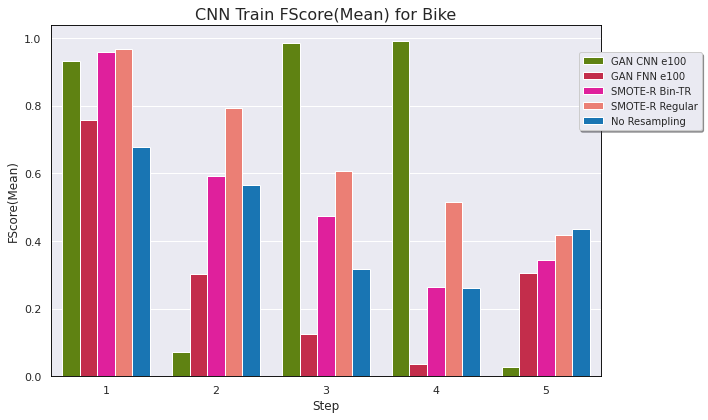

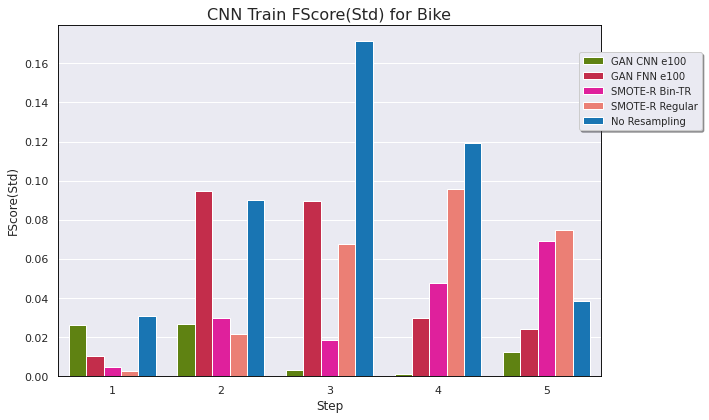

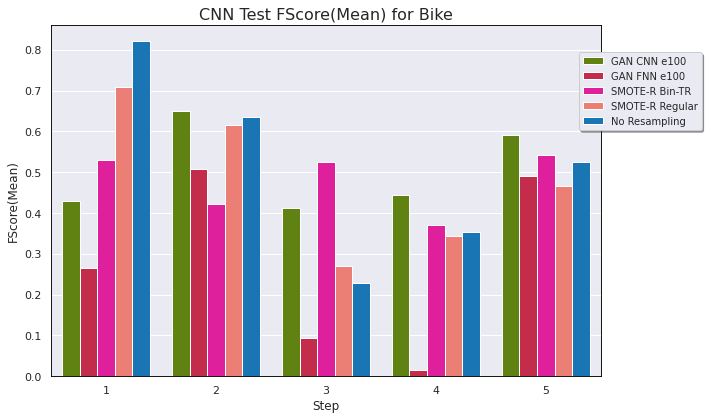

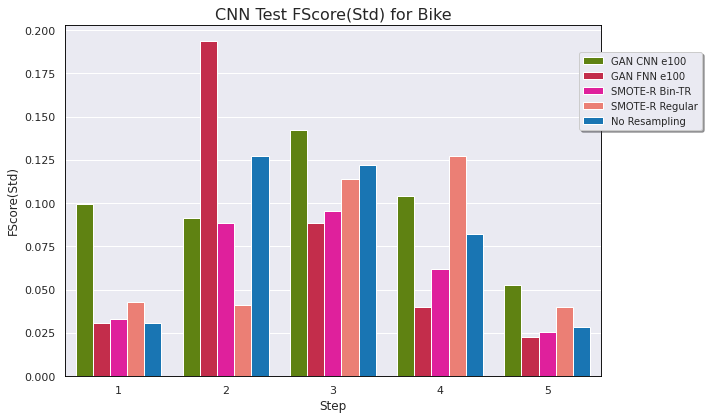

In [21]:
#Uncomment if you want to change stuff in plt_utils mid-session
#import plt_utils as pu
#importlib.reload(pu)
#Need to uncomment this is you're saving figures:
#pu.set_save_figs(True, RECORDER.figures_path)



plot_metrics = ["CaseWeight", "Utility", "RMSERare", "RMSE", "FScore"]
ts = ["Train", "Test"]
aggs = ["Mean", "Std"]
#either plot mean or std of the experiments
for f in FORECASTERS:
    best_cnn_gan = BEST_RESULTS[f]['cnn_gan']
    best_fnn_gan = BEST_RESULTS[f]['fnn_gan']
    best_bin = BEST_RESULTS[f]['bin']
    for metric in plot_metrics:
        for t in ts:
            tb = True if t == "Test" else False
            df_results = EVALERS[f].getExperimentSummaryDf(metric, tb)
            for a in aggs:
                #filter out all GAN_CNNs, GAN_FNNs or SMOTER_bins that aren't the best
                filtered_df = df_results[((df_results['Res'].str.contains('GAN_CNN|GAN_FNN')) & ((df_results['Res'] == best_cnn_gan) | (df_results['Res'] == best_fnn_gan))) | (~df_results['Res'].str.contains('GAN_CNN|GAN_FNN'))]
                filtered_df = filtered_df[((filtered_df['Res'].str.contains('SMOTER_bin')) & (filtered_df['Res'] == best_bin)) | (~filtered_df['Res'].str.contains('SMOTER_bin'))]
                pu.PlotStepBarResults(filtered_df, metric, a, t, DATA_NAME, N_STEPS_OUT, f)